# Swin Transformer + Unet++

1) load a data for a test
2) update a loop for test
3) for each epoch display a training loss , validation loss and test loss + ssim value also

# Data Loading

## Train

In [1]:
X_train_path = '/home/simlab120/Denoise_comp/Pragyant/image-impeccable-train-data-part1/42487393/seismic_w_noise_vol_42487393.npy'
y_train_path = '/home/simlab120/Denoise_comp/Pragyant/image-impeccable-train-data-part1/42487393/seismicCubes_RFC_fullstack_2024.42487393.npy'

## Test

In [2]:
X_test_path = '/home/simlab120/Denoise_comp/Pragyant/image-impeccable-test-data/2024-06-10_0d6402b1/seismic_w_noise_vol_44319345.npy'
y_test_path = '/home/simlab120/Denoise_comp/Pragyant/image-impeccable-train-data-part1/42487919/seismicCubes_RFC_fullstack_2024.42487919.npy'

## Valid

In [3]:
X_valid_path = '/home/simlab120/Denoise_comp/Pragyant/image-impeccable-train-data-part1/42502775/seismic_w_noise_vol_42502775.npy'
y_valid_path = '/home/simlab120/Denoise_comp/Pragyant/image-impeccable-train-data-part1/42502775/seismicCubes_RFC_fullstack_2024.42502775.npy'

In [4]:
shape = (1259,300,300)
# load the data
# make the data in 2d section
# make the train set and test set
# print the image also

In [5]:
import os
import pandas as pd
import numpy as np
from torchvision.io import read_image
from torch.utils.data import Dataset,DataLoader
import torch
# 2 files
# 1259*300*300 ---> 1259*300 in 300 images
# x,y load
# x,y sub sample
# pair
# return
class volDataset(Dataset):
    def __init__(self, x_slices, y_slices, transform=None):
        """
        x_slices: List of noisy seismic slices (each of shape 1259x300)
        y_slices: List of clean seismic slices (each of shape 1259x300)
        """
        self.x_slices = x_slices
        self.y_slices = y_slices
        self.transform = transform

    def __len__(self):
        return len(self.x_slices)

    def __getitem__(self, idx):
        """Returns one slice (1, 1259, 300)"""
        x_slice = torch.tensor(self.x_slices[idx], dtype=torch.float32).unsqueeze(0)  # (1, 1259, 300)
        y_slice = torch.tensor(self.y_slices[idx], dtype=torch.float32).unsqueeze(0)  # (1, 1259, 300)

        if self.transform:
            x_slice = self.transform(x_slice)
            y_slice = self.transform(y_slice)

        return x_slice, y_slice

In [6]:
from sklearn.model_selection import train_test_split
# Convert volume to 2D slices
# Load seismic volumes
X_volume = np.load('/home/simlab120/Denoise_comp/Pragyant/image-impeccable-train-data-part1/42487393/seismic_w_noise_vol_42487393.npy',allow_pickle=True)  # (1259, 300, 300)
y_volume = np.load('/home/simlab120/Denoise_comp/Pragyant/image-impeccable-train-data-part1/42487393/seismicCubes_RFC_fullstack_2024.42487393.npy',allow_pickle=True)  # (1259, 300, 300)

X_volume_t = np.load(X_test_path,allow_pickle=True)
y_volume_t = np.load(y_test_path,allow_pickle=True)

X_volume_v = np.load(X_valid_path,allow_pickle=True)
y_volume_v = np.load(y_valid_path,allow_pickle=True)
# Convert volume to 2D slices

X_slices = [X_volume[:, :, i] for i in range(X_volume.shape[2])]  # List of 300 slices
y_slices = [y_volume[:, :, i] for i in range(y_volume.shape[2])]  # List of 300 slices

X_slices_t = [X_volume_t[:, :, i] for i in range(X_volume_t.shape[2])]
y_slices_t = [y_volume_t[:, :, i] for i in range(y_volume_t.shape[2])]

X_slices_v = [X_volume_v[:, :, i] for i in range(X_volume_v.shape[2])]
y_slices_v = [y_volume_v[:, :, i] for i in range(y_volume_v.shape[2])]

# Create datasets
train_dataset = volDataset(X_slices, y_slices)
valid_dataset = volDataset(X_slices_v,y_slices_v)

# Create dataloaders
train_loader = DataLoader(train_dataset, batch_size=8, shuffle=True)
val_loader = DataLoader(valid_dataset,batch_size=8, shuffle=False)

# Check batch shapes
for x_batch, y_batch in train_loader:
    print("Train Batch Shape:", x_batch.shape, y_batch.shape)  # Expected: (8, 1, 1259, 300)
    break
for x_batch, y_batch in val_loader:
    print("valid Batch Shape:", x_batch.shape, y_batch.shape)  # Expected: (8, 1, 1259, 300)
    break

Train Batch Shape: torch.Size([8, 1, 1259, 300]) torch.Size([8, 1, 1259, 300])
valid Batch Shape: torch.Size([8, 1, 1259, 300]) torch.Size([8, 1, 1259, 300])


# Model

In [7]:
import os
import torch
from torch import nn
from torch.utils.data import DataLoader
from torchvision import datasets, transforms

In [8]:
class Crop2d(nn.Module):
    def __init__(self, left=10, right=10, top=21, bottom=0):
        super(Crop2d, self).__init__()
        self.left = left
        self.right = right
        self.top = top
        self.bottom = bottom

    def forward(self, x):
        return x[:, :, self.top:x.shape[2] - self.bottom, self.left:x.shape[3] - self.right]

In [9]:
pip install timm

Note: you may need to restart the kernel to use updated packages.


In [10]:
pip install segmentation_models_pytorch

Note: you may need to restart the kernel to use updated packages.


In [11]:
import timm
from segmentation_models_pytorch.decoders.unetplusplus import UnetPlusPlus

/home/simlab120/anaconda3/envs/torch/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [12]:
pip install torchvision

Note: you may need to restart the kernel to use updated packages.


In [13]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision
from torchvision.models.swin_transformer import Swin_V2_B_Weights



# ---------- Basic Block for UNet++ ----------
class DoubleConv(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(DoubleConv, self).__init__()
        self.double_conv = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True)
        )

    def forward(self, x):
        return self.double_conv(x)

# ---------- UNet++ Decoder ----------
class UNetPP(nn.Module):
    def __init__(self, in_channels=128, n_classes=1, bilinear=True):
        super(UNetPP, self).__init__()
        self.n_classes = n_classes
        self.bilinear = bilinear

        self.conv1 = DoubleConv(in_channels, 64)
        self.conv2 = DoubleConv(64, 32)
        self.conv3 = DoubleConv(32, 16)
        self.conv4 = nn.Conv2d(16, n_classes, kernel_size=1)

    def forward(self, x):
        x1 = self.conv1(x)
        x2 = self.conv2(F.interpolate(x1, scale_factor=2, mode='bilinear', align_corners=False))
        x3 = self.conv3(F.interpolate(x2, scale_factor=2, mode='bilinear', align_corners=False))
        x4 = self.conv4(F.interpolate(x3, scale_factor=2, mode='bilinear', align_corners=False))
        return x4

# ---------- SwinUNet++ ----------
class SwinUNetPP(nn.Module):
    def __init__(self):
        super(SwinUNetPP, self).__init__()
        self.encoder = torchvision.models.swin_v2_b(weights=Swin_V2_B_Weights.IMAGENET1K_V1)
        self.zero_pad = nn.ZeroPad2d((10, 10, 21, 0))
        self.decoder = UNetPP(in_channels=40, n_classes=1)  # ✅ fixed here
        self.crop = Crop2d(10, 10, 21, 0)

    def forward(self, x):
        x = self.zero_pad(x)
        x = x.expand(-1, 3, -1, -1)                                # (1,1,1259,300) -> (1,1,1269,308)
        x = self.encoder.features(x)                         # Swin feature extraction
        x = self.decoder(x) 
          # maybe outputs (1,1,1238,280)
        x = F.interpolate(x, size=(1259+21,300+20), mode='bilinear')
                                 # UNet++ decode
        x = self.crop(x)
        return x

# ---------- Testing ----------
if __name__ == "__main__":
    model = SwinUNetPP()
    model.eval()
    x = torch.randn(1, 1, 1259, 300)   # Simulating a single seismic image
    out = model(x)
    print(out.shape)                   # ✅ Should print torch.Size([1, 1, 1259, 300])


torch.Size([1, 1, 1259, 300])


In [14]:
pip install torcheval

Note: you may need to restart the kernel to use updated packages.


In [15]:
import torch
import torch.nn as nn
import torch.optim as optim

# Define model
model = SwinUNetPP()

# Define Loss Function (MSE for denoising)
criterion = nn.MSELoss()

# Define Optimizer (Adam works well)
optimizer = optim.Adam(model.parameters(), lr=0.1)

In [16]:
# Check batch shapes
for x_batch, y_batch in train_loader:
    print("Train Batch Shape:", x_batch.shape, y_batch.shape)  # Expected: (batch_size, 1, 1259, 300)
    break

Train Batch Shape: torch.Size([8, 1, 1259, 300]) torch.Size([8, 1, 1259, 300])


In [17]:
from torchmetrics import StructuralSimilarityIndexMeasure
ssim_metric = StructuralSimilarityIndexMeasure()

/home/simlab120/anaconda3/envs/torch/lib/python3.12/site-packages/torchmetrics/utilities/prints.py:62: FutureWarning: Importing `StructuralSimilarityIndexMeasure` from `torchmetrics` was deprecated and will be removed in 2.0. Import `StructuralSimilarityIndexMeasure` from `torchmetrics.image` instead.
  _future_warning(


In [18]:
import matplotlib.pyplot as plt

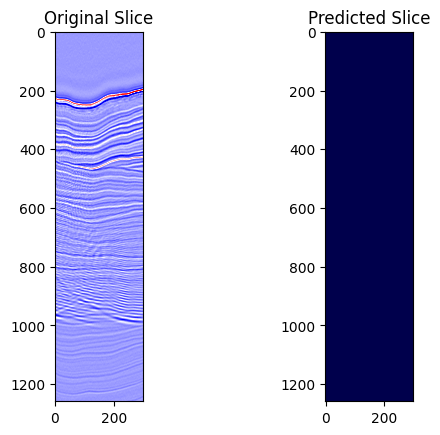

Epoch [1/200], Train Loss: 10076.4240, Train SSIM: 0.4743,           Val Loss: 10088.1913, Val SSIM: 0.4163


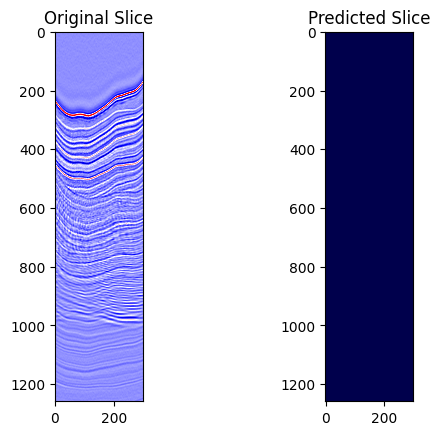

Epoch [2/200], Train Loss: 10059.0889, Train SSIM: 0.4734,           Val Loss: 10088.1914, Val SSIM: 0.4163


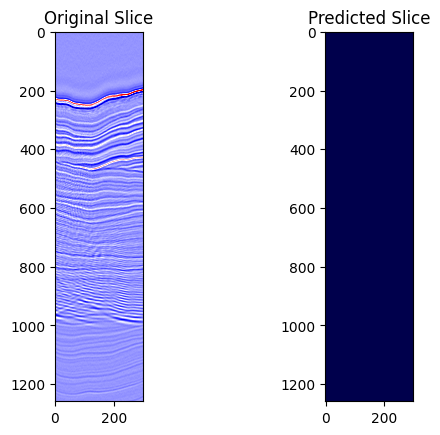

Epoch [3/200], Train Loss: 10062.6769, Train SSIM: 0.4742,           Val Loss: 10088.1913, Val SSIM: 0.4163


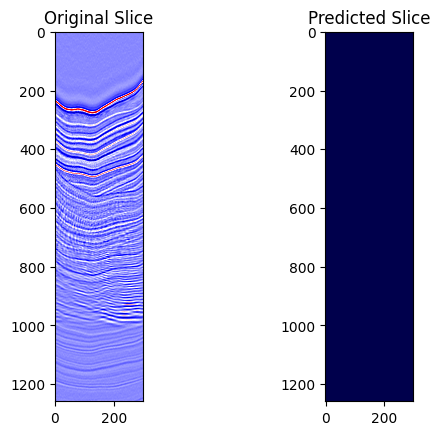

Epoch [4/200], Train Loss: 10074.5865, Train SSIM: 0.4743,           Val Loss: 10088.1914, Val SSIM: 0.4163


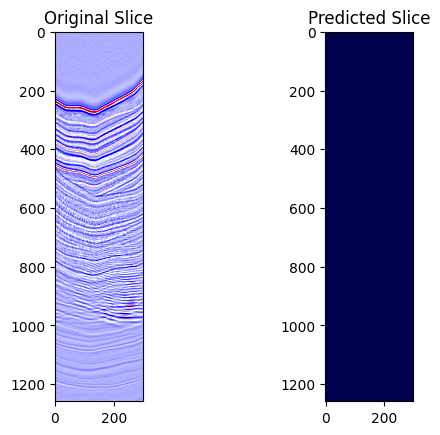

Epoch [5/200], Train Loss: 10069.4834, Train SSIM: 0.4732,           Val Loss: 10088.1916, Val SSIM: 0.4163


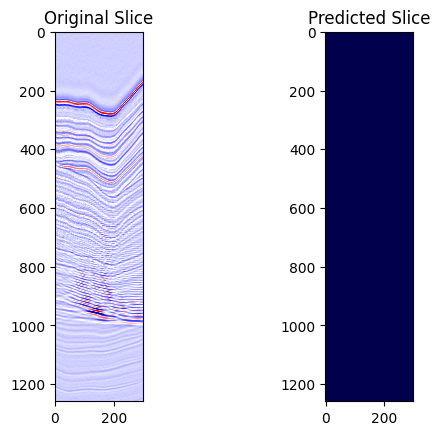

Epoch [6/200], Train Loss: 10069.3710, Train SSIM: 0.4737,           Val Loss: 10088.1915, Val SSIM: 0.4163


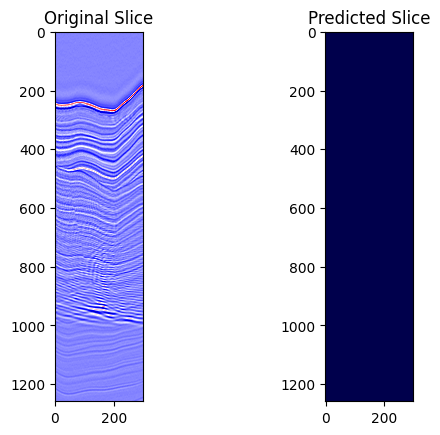

Epoch [7/200], Train Loss: 10080.7208, Train SSIM: 0.4726,           Val Loss: 10088.1915, Val SSIM: 0.4163


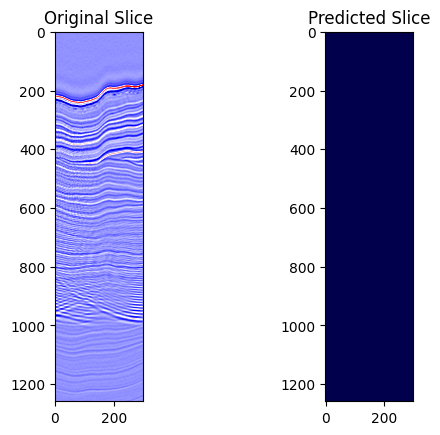

Epoch [8/200], Train Loss: 10073.0722, Train SSIM: 0.4737,           Val Loss: 10088.1914, Val SSIM: 0.4163


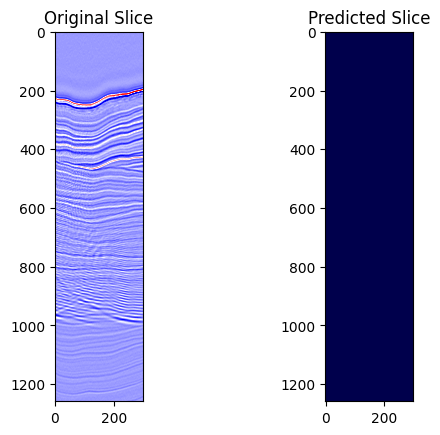

Epoch [9/200], Train Loss: 10075.3698, Train SSIM: 0.4743,           Val Loss: 10088.1915, Val SSIM: 0.4163


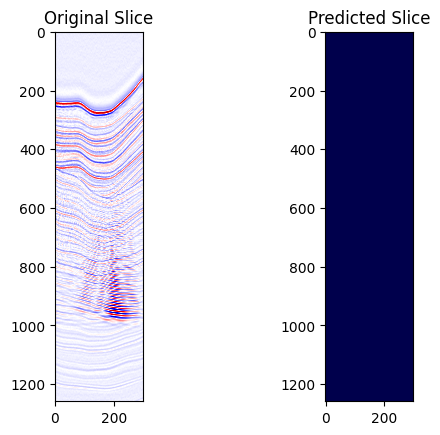

Epoch [10/200], Train Loss: 10065.4858, Train SSIM: 0.4730,           Val Loss: 10088.1913, Val SSIM: 0.4163


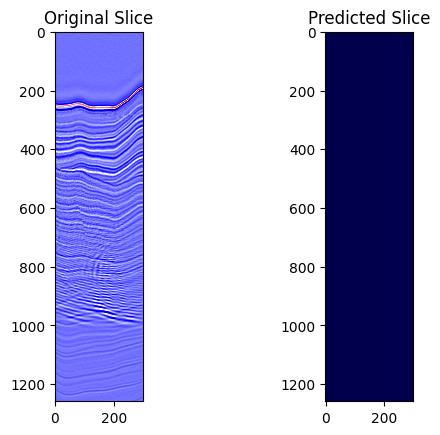

Epoch [11/200], Train Loss: 10064.1443, Train SSIM: 0.4730,           Val Loss: 10088.1912, Val SSIM: 0.4163


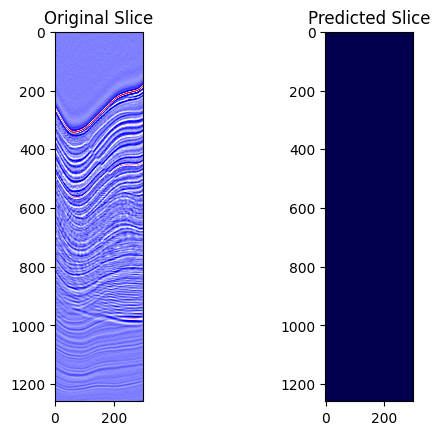

Epoch [12/200], Train Loss: 10066.8592, Train SSIM: 0.4736,           Val Loss: 10088.1915, Val SSIM: 0.4163


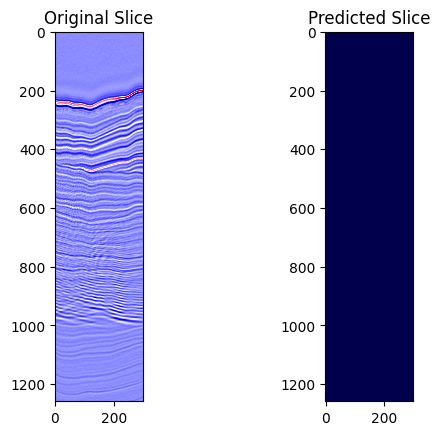

Epoch [13/200], Train Loss: 10067.3663, Train SSIM: 0.4732,           Val Loss: 10088.1913, Val SSIM: 0.4163


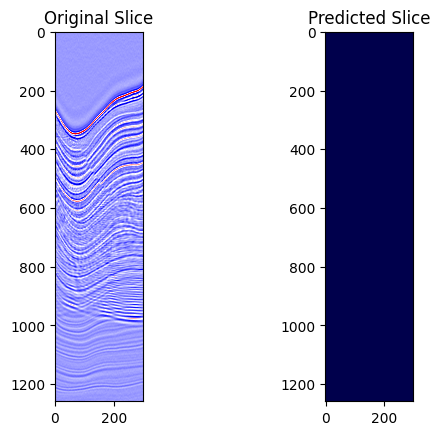

Epoch [14/200], Train Loss: 10063.2726, Train SSIM: 0.4720,           Val Loss: 10088.1914, Val SSIM: 0.4163


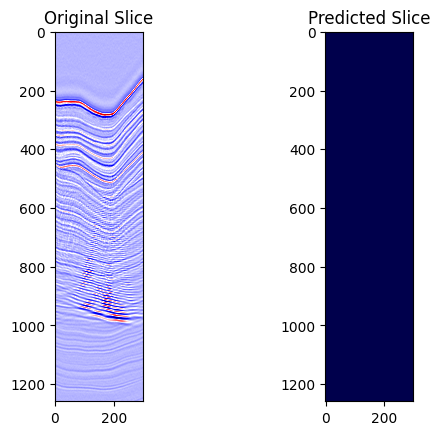

Epoch [15/200], Train Loss: 10074.6419, Train SSIM: 0.4734,           Val Loss: 10088.1911, Val SSIM: 0.4163


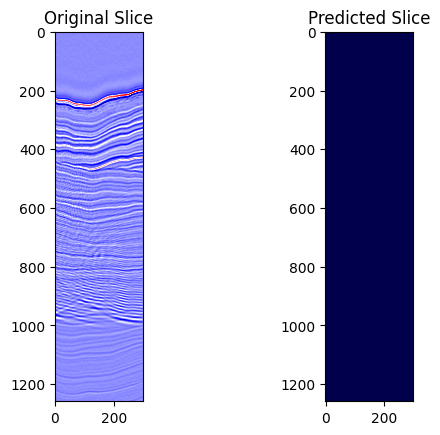

Epoch [16/200], Train Loss: 10073.3628, Train SSIM: 0.4741,           Val Loss: 10088.1913, Val SSIM: 0.4163


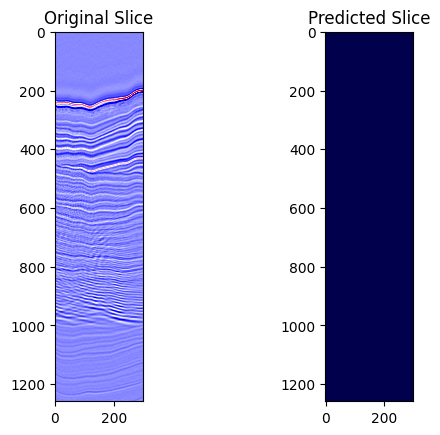

Epoch [17/200], Train Loss: 10064.8331, Train SSIM: 0.4738,           Val Loss: 10088.1911, Val SSIM: 0.4163


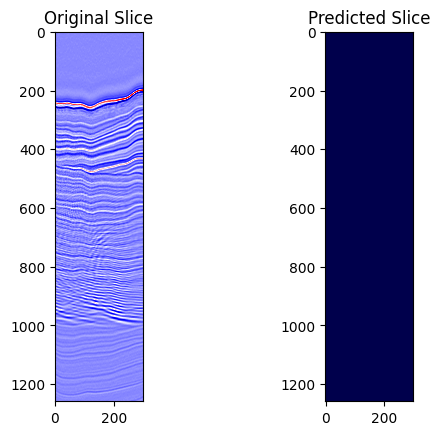

Epoch [18/200], Train Loss: 10069.2493, Train SSIM: 0.4750,           Val Loss: 10088.1914, Val SSIM: 0.4163


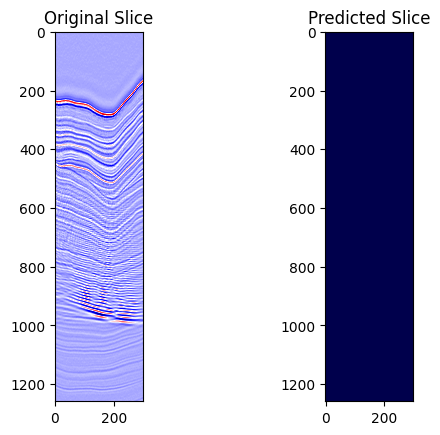

Epoch [19/200], Train Loss: 10061.1767, Train SSIM: 0.4734,           Val Loss: 10088.1915, Val SSIM: 0.4163


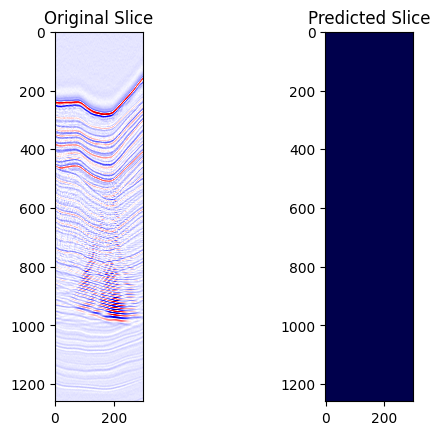

Epoch [20/200], Train Loss: 10079.8159, Train SSIM: 0.4733,           Val Loss: 10088.1911, Val SSIM: 0.4163


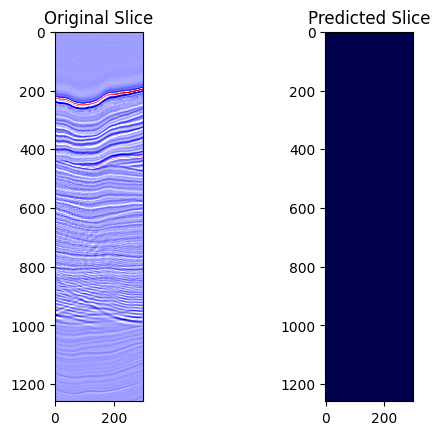

Epoch [21/200], Train Loss: 10072.8488, Train SSIM: 0.4740,           Val Loss: 10088.1912, Val SSIM: 0.4163


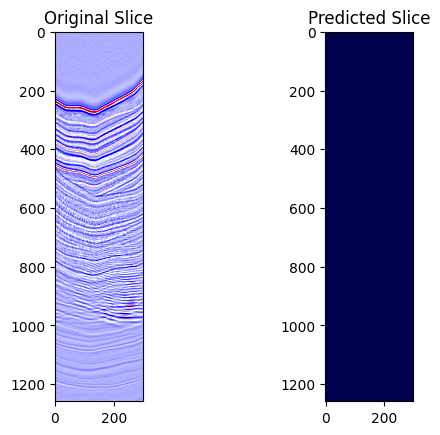

Epoch [22/200], Train Loss: 10065.0544, Train SSIM: 0.4742,           Val Loss: 10088.1909, Val SSIM: 0.4163


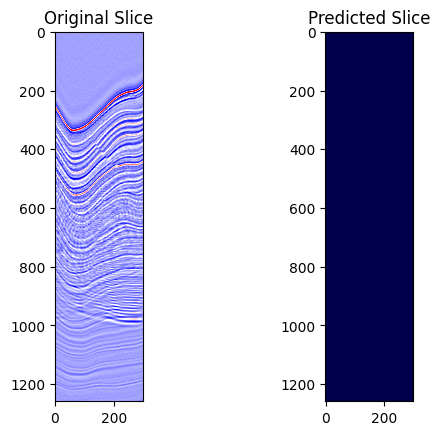

Epoch [23/200], Train Loss: 10072.5960, Train SSIM: 0.4738,           Val Loss: 10088.1911, Val SSIM: 0.4163


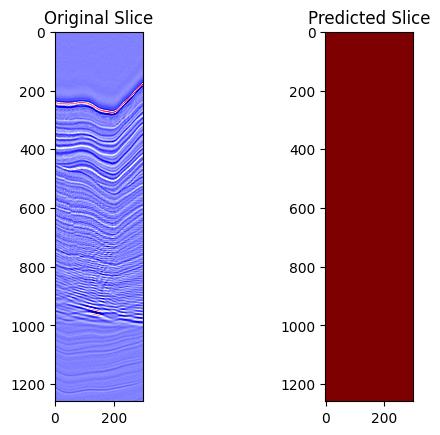

Epoch [24/200], Train Loss: 10085.2031, Train SSIM: 0.4743,           Val Loss: 10088.1913, Val SSIM: 0.4163


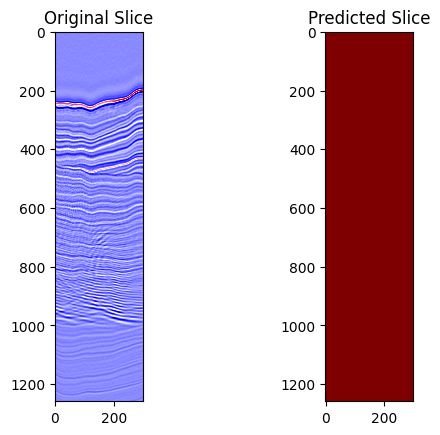

Epoch [25/200], Train Loss: 10064.6207, Train SSIM: 0.4734,           Val Loss: 10088.1913, Val SSIM: 0.4163


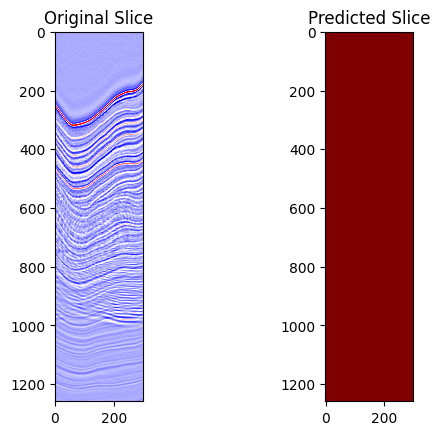

Epoch [26/200], Train Loss: 10068.3674, Train SSIM: 0.4734,           Val Loss: 10088.1914, Val SSIM: 0.4163


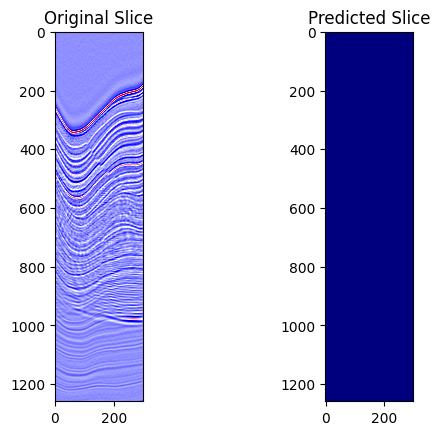

Epoch [27/200], Train Loss: 10068.4511, Train SSIM: 0.4736,           Val Loss: 10088.1911, Val SSIM: 0.4163


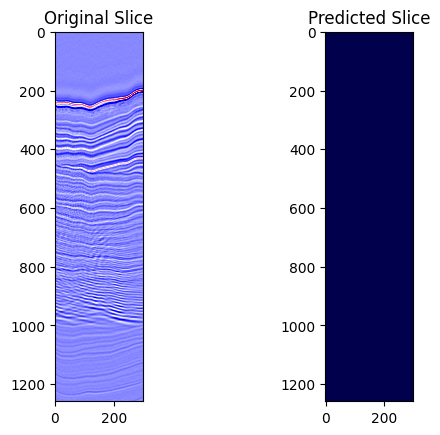

Epoch [28/200], Train Loss: 10077.9172, Train SSIM: 0.4740,           Val Loss: 10088.1910, Val SSIM: 0.4163


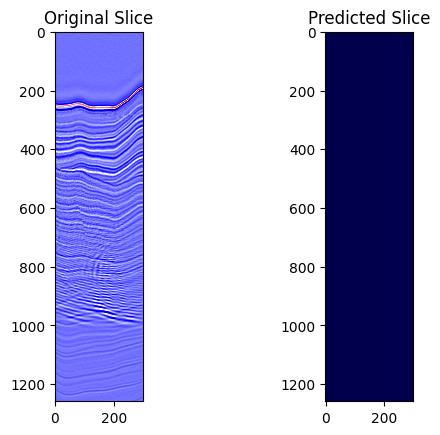

Epoch [29/200], Train Loss: 10066.4244, Train SSIM: 0.4736,           Val Loss: 10088.1914, Val SSIM: 0.4163


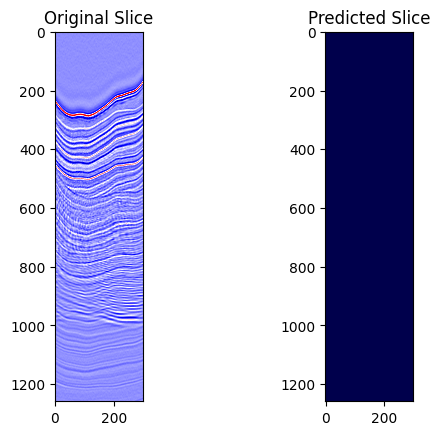

Epoch [30/200], Train Loss: 10077.5659, Train SSIM: 0.4734,           Val Loss: 10088.1914, Val SSIM: 0.4163


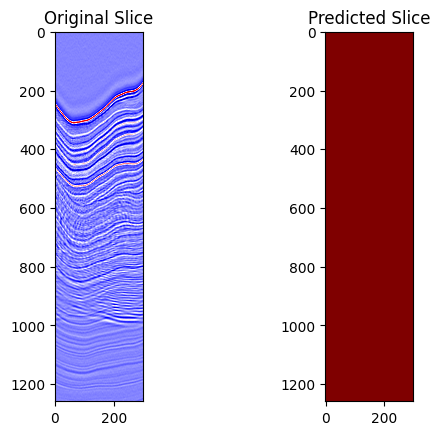

Epoch [31/200], Train Loss: 10060.4901, Train SSIM: 0.4740,           Val Loss: 10088.1915, Val SSIM: 0.4163


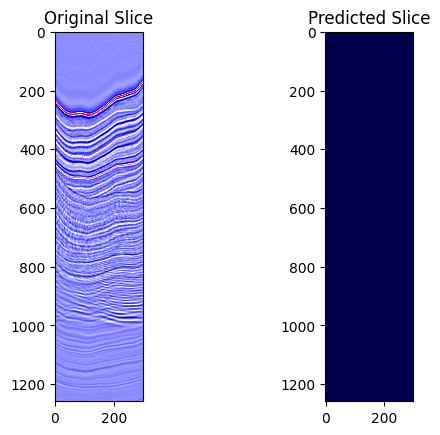

Epoch [32/200], Train Loss: 10082.3146, Train SSIM: 0.4725,           Val Loss: 10088.1911, Val SSIM: 0.4163


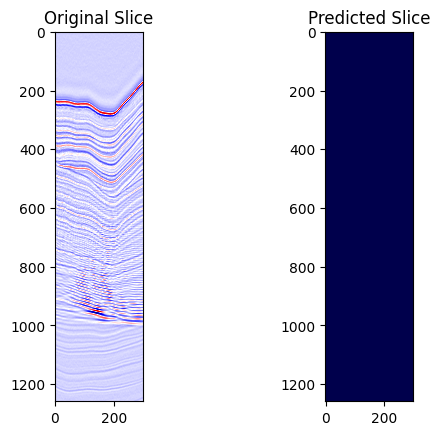

Epoch [33/200], Train Loss: 10081.3567, Train SSIM: 0.4729,           Val Loss: 10088.1916, Val SSIM: 0.4163


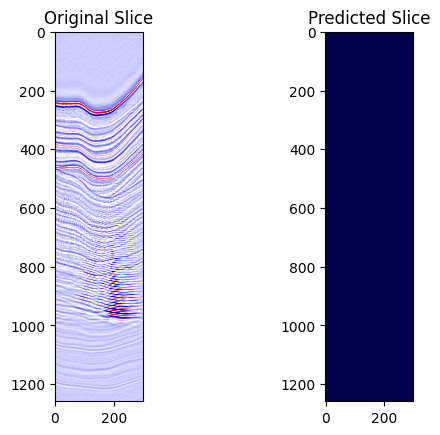

Epoch [34/200], Train Loss: 10066.3275, Train SSIM: 0.4739,           Val Loss: 10088.1915, Val SSIM: 0.4163


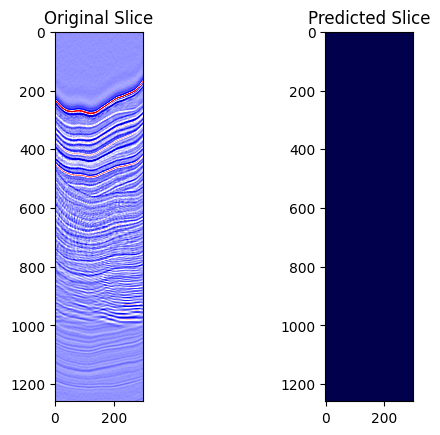

Epoch [35/200], Train Loss: 10060.8929, Train SSIM: 0.4744,           Val Loss: 10088.1912, Val SSIM: 0.4163


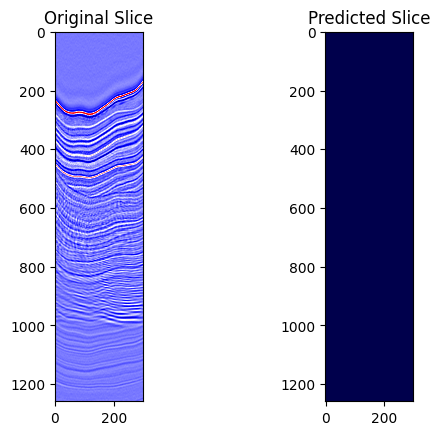

Epoch [36/200], Train Loss: 10065.5223, Train SSIM: 0.4740,           Val Loss: 10088.1910, Val SSIM: 0.4163


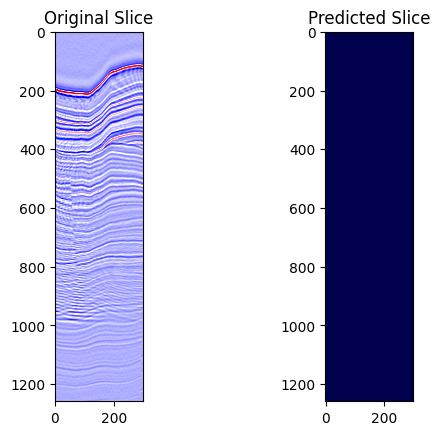

Epoch [37/200], Train Loss: 10069.2940, Train SSIM: 0.4738,           Val Loss: 10088.1913, Val SSIM: 0.4163


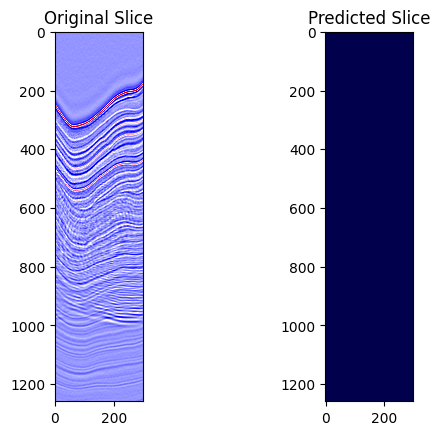

Epoch [38/200], Train Loss: 10073.7539, Train SSIM: 0.4743,           Val Loss: 10088.1912, Val SSIM: 0.4163


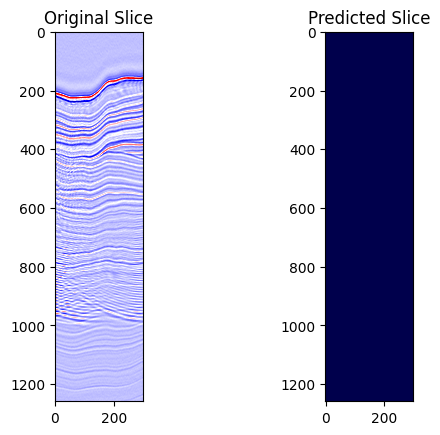

Epoch [39/200], Train Loss: 10069.1142, Train SSIM: 0.4745,           Val Loss: 10088.1915, Val SSIM: 0.4163


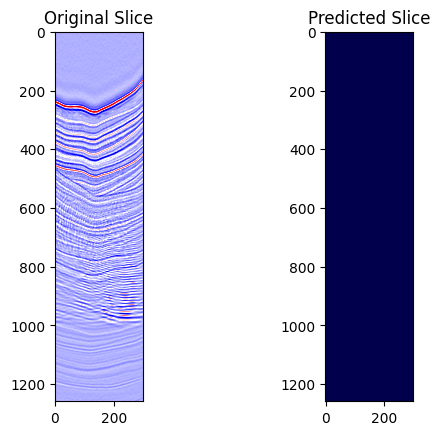

Epoch [40/200], Train Loss: 10075.8744, Train SSIM: 0.4749,           Val Loss: 10088.1912, Val SSIM: 0.4163


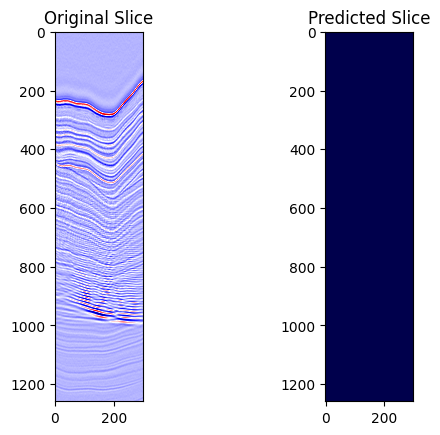

Epoch [41/200], Train Loss: 10071.1842, Train SSIM: 0.4744,           Val Loss: 10088.1913, Val SSIM: 0.4163


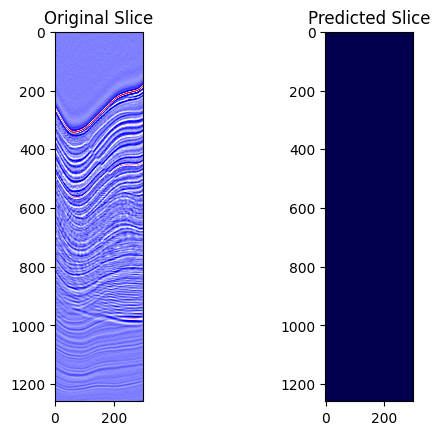

Epoch [42/200], Train Loss: 10084.3644, Train SSIM: 0.4721,           Val Loss: 10088.1915, Val SSIM: 0.4163


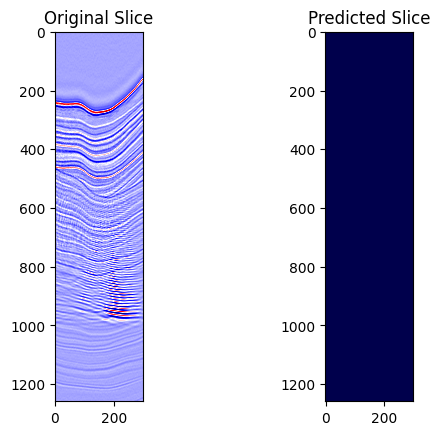

Epoch [43/200], Train Loss: 10081.1647, Train SSIM: 0.4729,           Val Loss: 10088.1913, Val SSIM: 0.4163


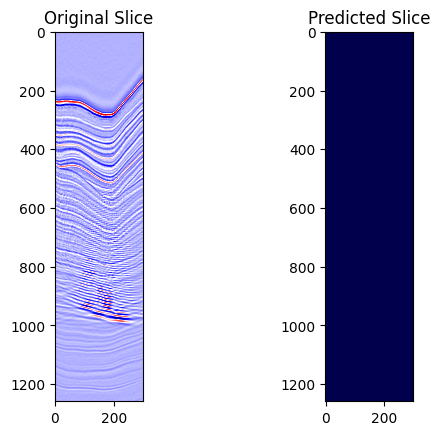

Epoch [44/200], Train Loss: 10083.4196, Train SSIM: 0.4730,           Val Loss: 10088.1916, Val SSIM: 0.4163


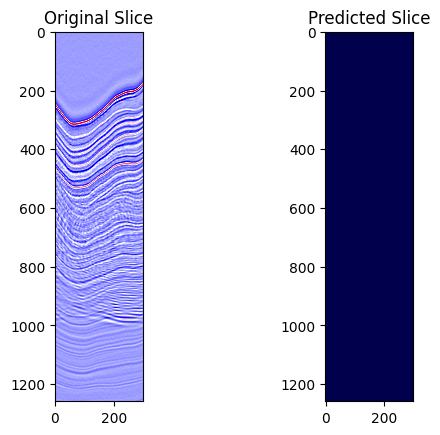

Epoch [45/200], Train Loss: 10082.4626, Train SSIM: 0.4740,           Val Loss: 10088.1913, Val SSIM: 0.4163


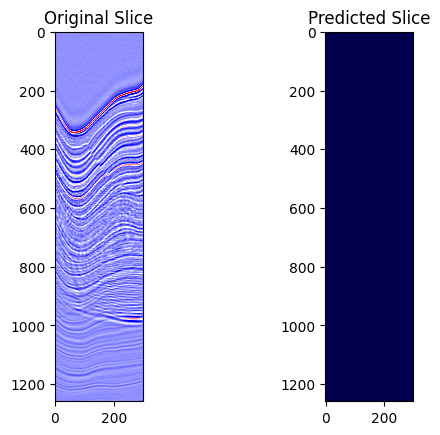

Epoch [46/200], Train Loss: 10068.7625, Train SSIM: 0.4749,           Val Loss: 10088.1911, Val SSIM: 0.4163


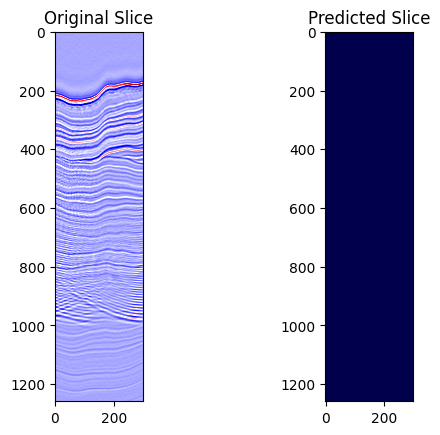

Epoch [47/200], Train Loss: 10073.8853, Train SSIM: 0.4728,           Val Loss: 10088.1916, Val SSIM: 0.4163


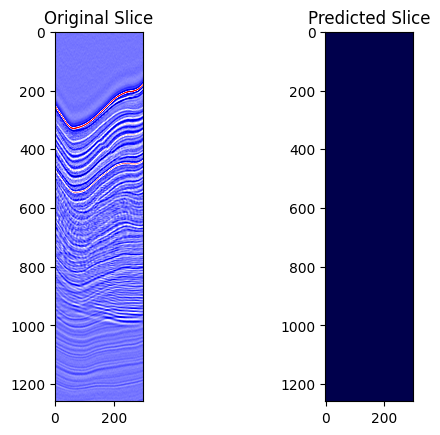

Epoch [48/200], Train Loss: 10086.8003, Train SSIM: 0.4740,           Val Loss: 10088.1912, Val SSIM: 0.4163


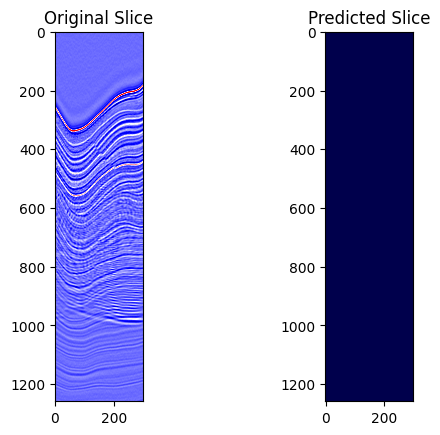

Epoch [49/200], Train Loss: 10069.0238, Train SSIM: 0.4735,           Val Loss: 10088.1913, Val SSIM: 0.4163


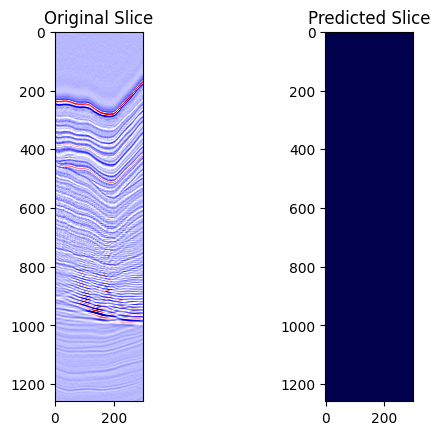

Epoch [50/200], Train Loss: 10066.9194, Train SSIM: 0.4740,           Val Loss: 10088.1914, Val SSIM: 0.4163


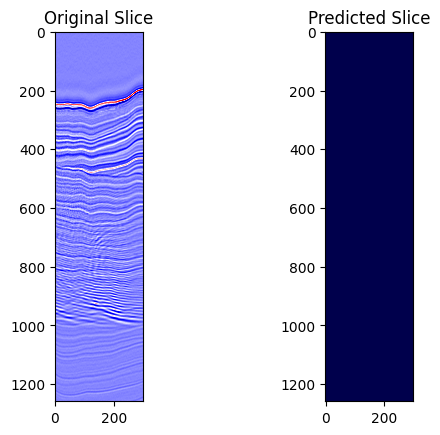

Epoch [51/200], Train Loss: 10073.7039, Train SSIM: 0.4742,           Val Loss: 10088.1914, Val SSIM: 0.4163


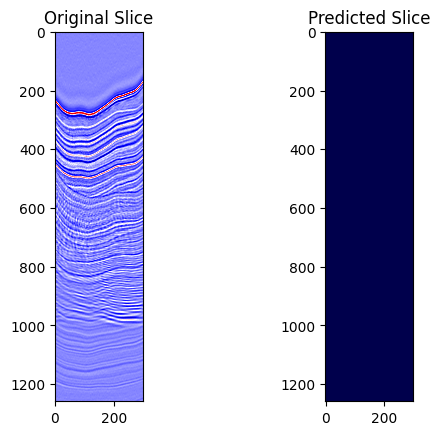

Epoch [52/200], Train Loss: 10075.6368, Train SSIM: 0.4740,           Val Loss: 10088.1914, Val SSIM: 0.4163


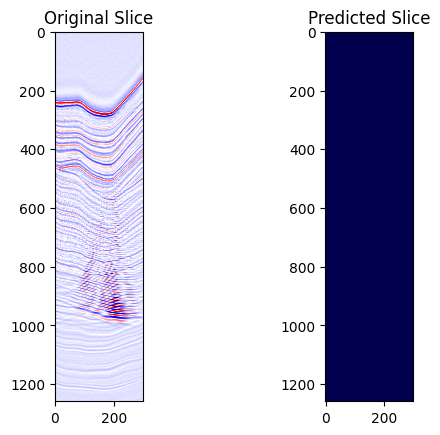

Epoch [53/200], Train Loss: 10074.1017, Train SSIM: 0.4737,           Val Loss: 10088.1919, Val SSIM: 0.4163


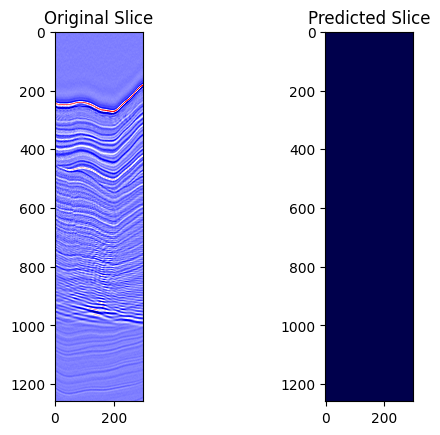

Epoch [54/200], Train Loss: 10069.8755, Train SSIM: 0.4727,           Val Loss: 10088.1914, Val SSIM: 0.4163


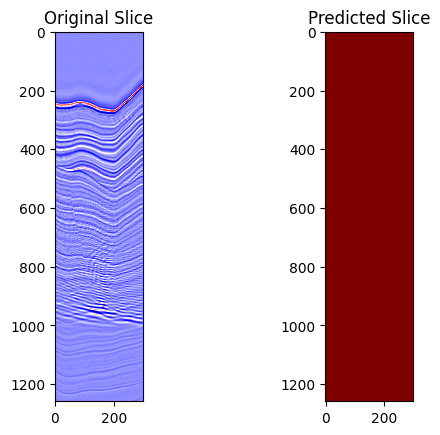

Epoch [55/200], Train Loss: 10071.8038, Train SSIM: 0.4740,           Val Loss: 10088.1913, Val SSIM: 0.4163


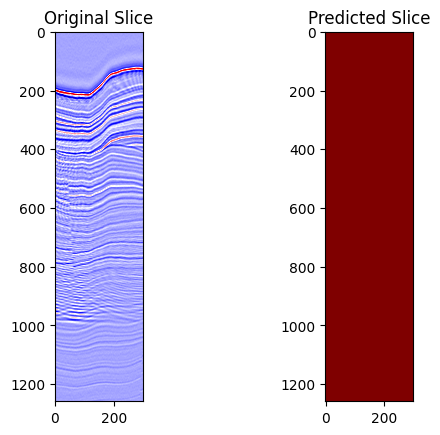

Epoch [56/200], Train Loss: 10062.4781, Train SSIM: 0.4743,           Val Loss: 10088.1910, Val SSIM: 0.4163


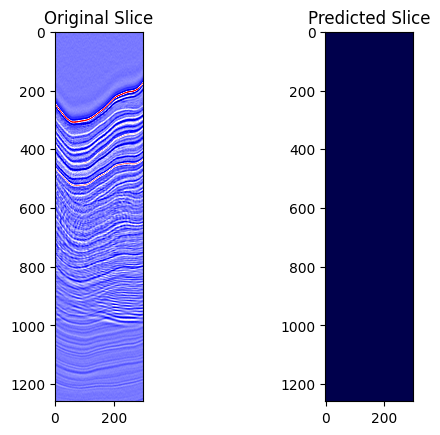

Epoch [57/200], Train Loss: 10073.1040, Train SSIM: 0.4739,           Val Loss: 10088.1913, Val SSIM: 0.4163


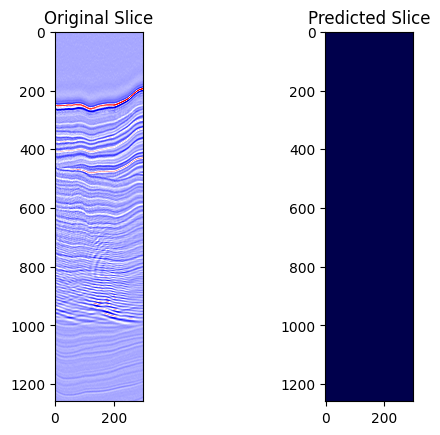

Epoch [58/200], Train Loss: 10063.5890, Train SSIM: 0.4731,           Val Loss: 10088.1912, Val SSIM: 0.4163


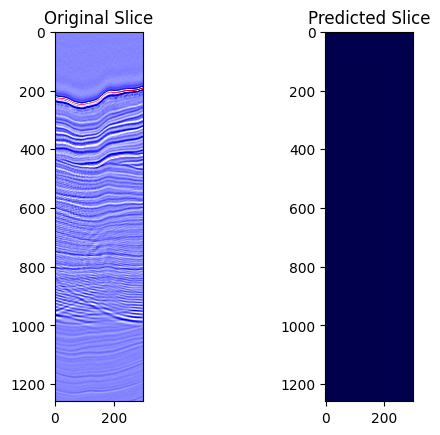

Epoch [59/200], Train Loss: 10066.4816, Train SSIM: 0.4737,           Val Loss: 10088.1910, Val SSIM: 0.4163


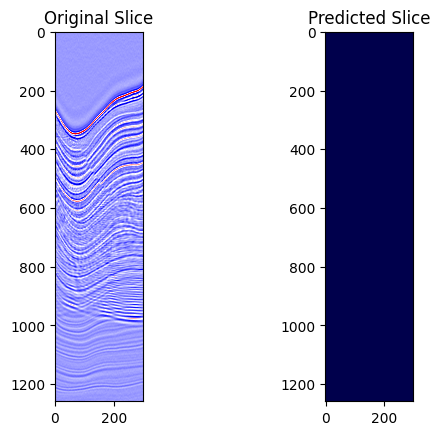

Epoch [60/200], Train Loss: 10078.3142, Train SSIM: 0.4739,           Val Loss: 10088.1915, Val SSIM: 0.4163


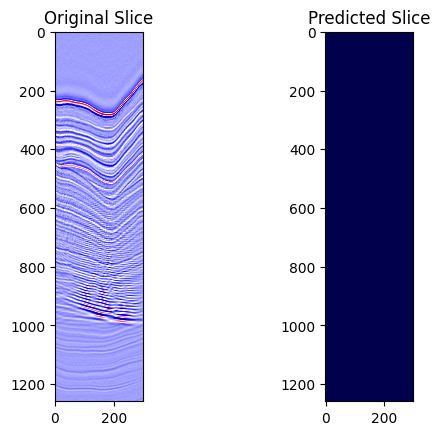

Epoch [61/200], Train Loss: 10069.8824, Train SSIM: 0.4733,           Val Loss: 10088.1911, Val SSIM: 0.4163


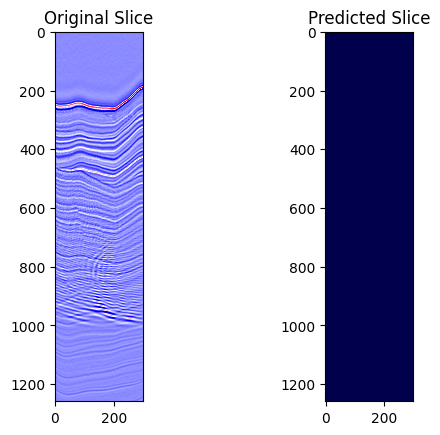

Epoch [62/200], Train Loss: 10063.0821, Train SSIM: 0.4744,           Val Loss: 10088.1912, Val SSIM: 0.4163


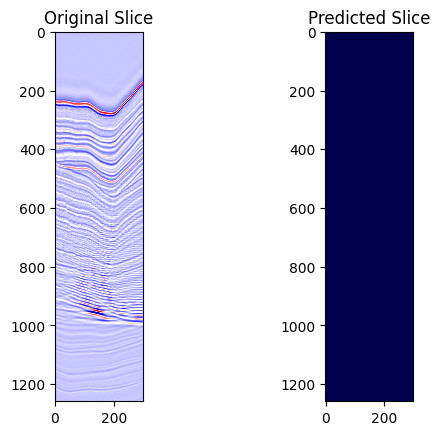

Epoch [63/200], Train Loss: 10073.1984, Train SSIM: 0.4741,           Val Loss: 10088.1910, Val SSIM: 0.4163


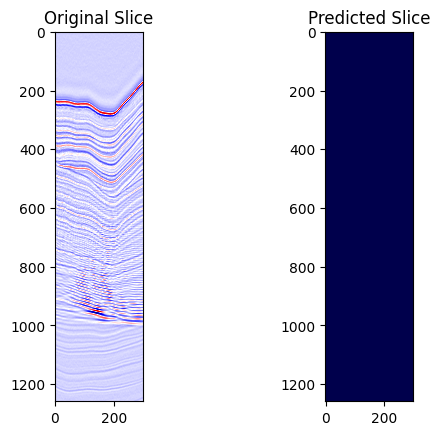

Epoch [64/200], Train Loss: 10074.7383, Train SSIM: 0.4743,           Val Loss: 10088.1910, Val SSIM: 0.4163


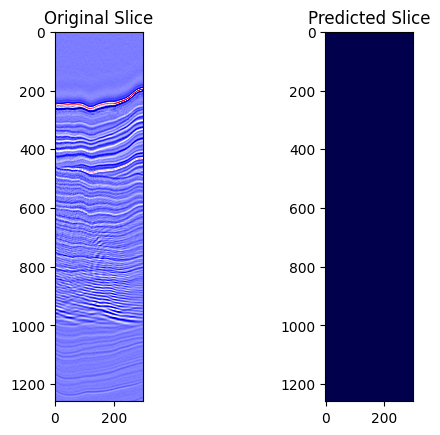

Epoch [65/200], Train Loss: 10061.1372, Train SSIM: 0.4733,           Val Loss: 10088.1911, Val SSIM: 0.4163


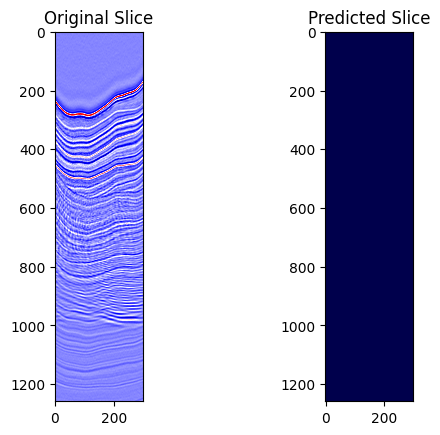

Epoch [66/200], Train Loss: 10068.5493, Train SSIM: 0.4741,           Val Loss: 10088.1910, Val SSIM: 0.4163


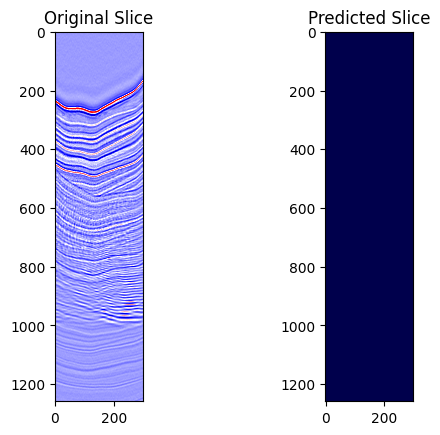

Epoch [67/200], Train Loss: 10070.8142, Train SSIM: 0.4740,           Val Loss: 10088.1913, Val SSIM: 0.4163


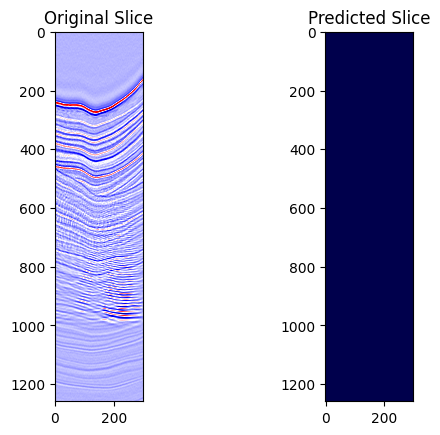

Epoch [68/200], Train Loss: 10066.8297, Train SSIM: 0.4733,           Val Loss: 10088.1914, Val SSIM: 0.4163


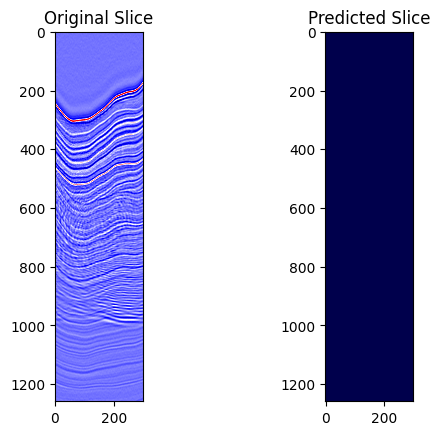

Epoch [69/200], Train Loss: 10084.3869, Train SSIM: 0.4734,           Val Loss: 10088.1916, Val SSIM: 0.4163


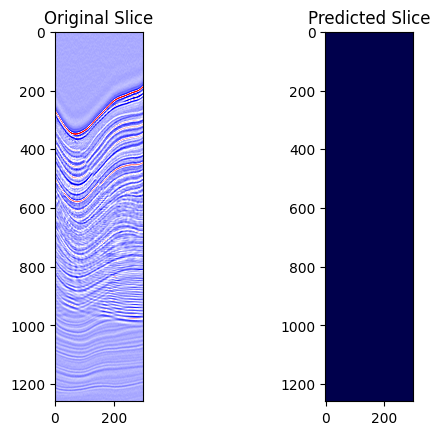

Epoch [70/200], Train Loss: 10071.2761, Train SSIM: 0.4732,           Val Loss: 10088.1914, Val SSIM: 0.4163


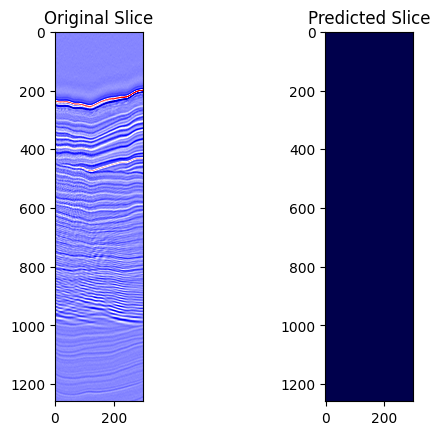

Epoch [71/200], Train Loss: 10070.5329, Train SSIM: 0.4739,           Val Loss: 10088.1914, Val SSIM: 0.4163


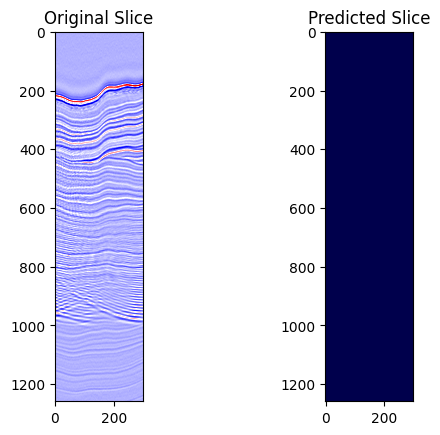

Epoch [72/200], Train Loss: 10064.0900, Train SSIM: 0.4746,           Val Loss: 10088.1912, Val SSIM: 0.4163


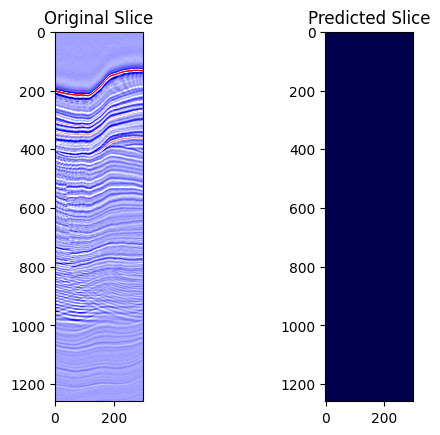

Epoch [73/200], Train Loss: 10070.6421, Train SSIM: 0.4745,           Val Loss: 10088.1913, Val SSIM: 0.4163


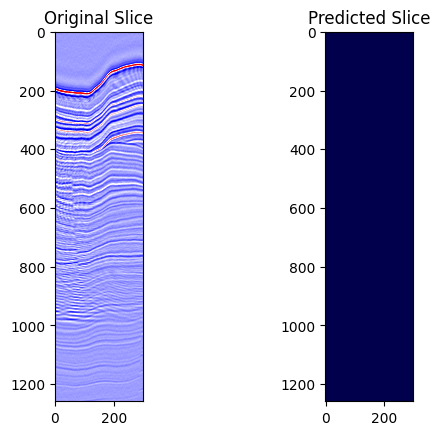

Epoch [74/200], Train Loss: 10072.0194, Train SSIM: 0.4740,           Val Loss: 10088.1913, Val SSIM: 0.4163


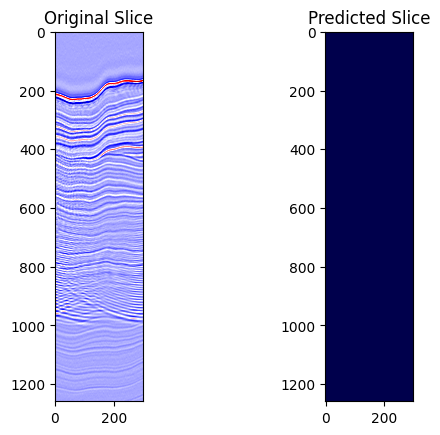

Epoch [75/200], Train Loss: 10061.6045, Train SSIM: 0.4734,           Val Loss: 10088.1913, Val SSIM: 0.4163


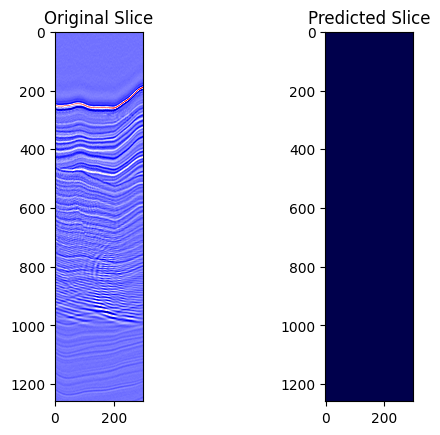

Epoch [76/200], Train Loss: 10073.8106, Train SSIM: 0.4731,           Val Loss: 10088.1910, Val SSIM: 0.4163


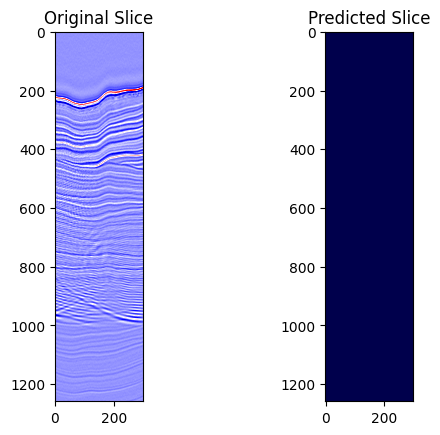

Epoch [77/200], Train Loss: 10064.6507, Train SSIM: 0.4734,           Val Loss: 10088.1913, Val SSIM: 0.4163


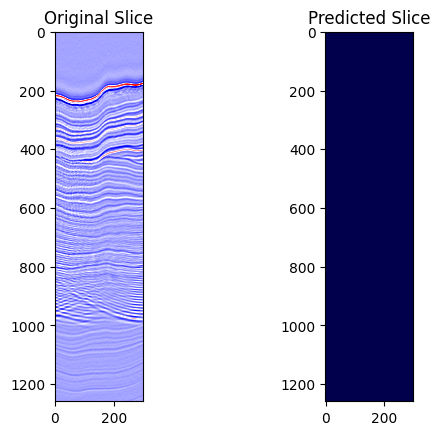

Epoch [78/200], Train Loss: 10074.8394, Train SSIM: 0.4729,           Val Loss: 10088.1911, Val SSIM: 0.4163


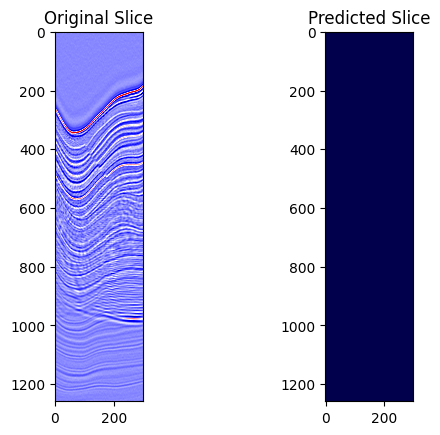

Epoch [79/200], Train Loss: 10063.5876, Train SSIM: 0.4731,           Val Loss: 10088.1912, Val SSIM: 0.4163


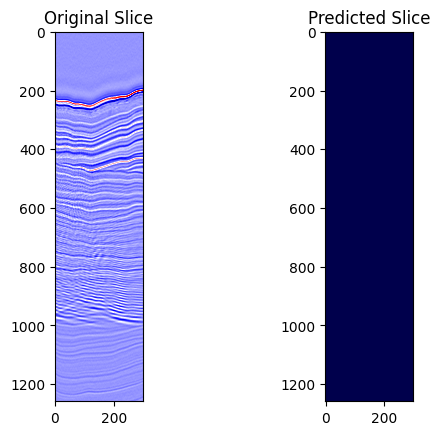

Epoch [80/200], Train Loss: 10071.2848, Train SSIM: 0.4741,           Val Loss: 10088.1911, Val SSIM: 0.4163


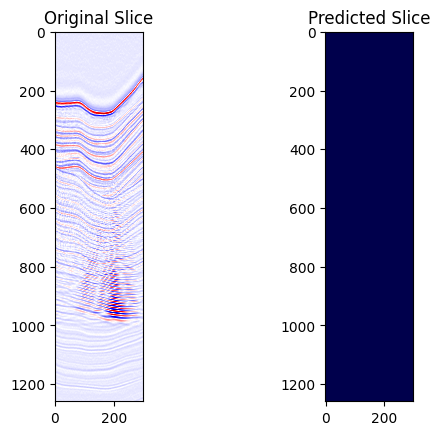

Epoch [81/200], Train Loss: 10083.6733, Train SSIM: 0.4735,           Val Loss: 10088.1914, Val SSIM: 0.4163


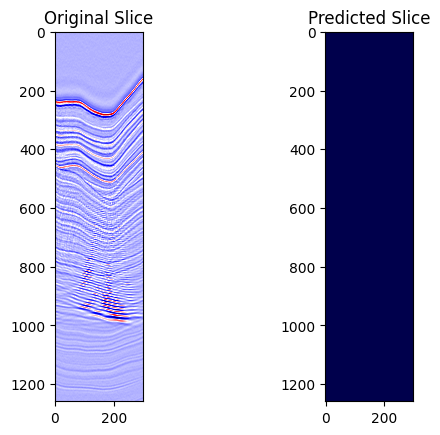

Epoch [82/200], Train Loss: 10067.5470, Train SSIM: 0.4742,           Val Loss: 10088.1916, Val SSIM: 0.4163


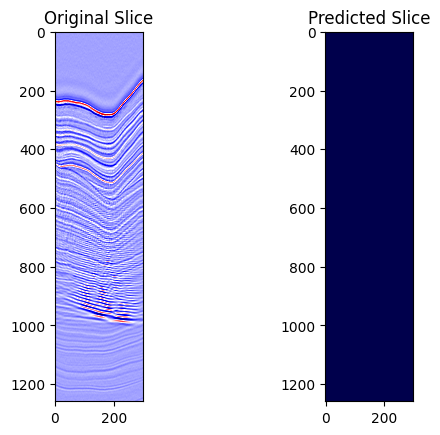

Epoch [83/200], Train Loss: 10057.0419, Train SSIM: 0.4735,           Val Loss: 10088.1914, Val SSIM: 0.4163


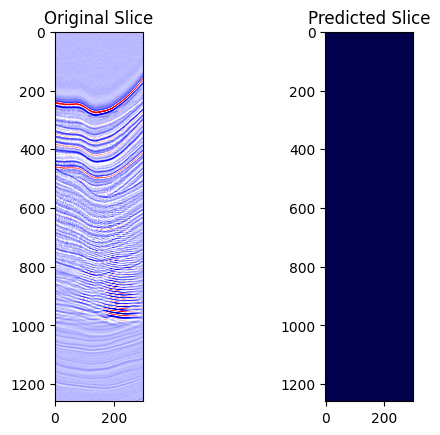

Epoch [84/200], Train Loss: 10083.3752, Train SSIM: 0.4735,           Val Loss: 10088.1913, Val SSIM: 0.4163


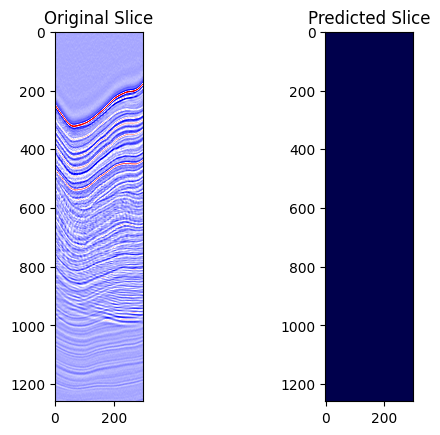

Epoch [85/200], Train Loss: 10068.2078, Train SSIM: 0.4740,           Val Loss: 10088.1913, Val SSIM: 0.4163


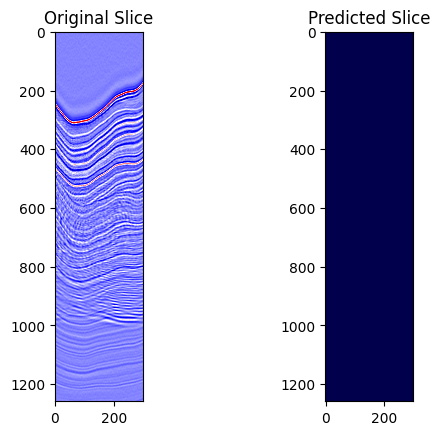

Epoch [86/200], Train Loss: 10070.5184, Train SSIM: 0.4734,           Val Loss: 10088.1915, Val SSIM: 0.4163


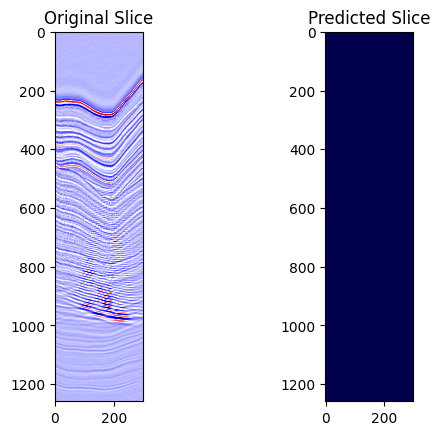

Epoch [87/200], Train Loss: 10076.6832, Train SSIM: 0.4736,           Val Loss: 10088.1912, Val SSIM: 0.4163


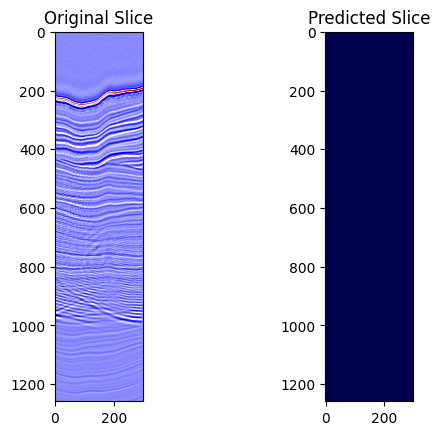

Epoch [88/200], Train Loss: 10075.3517, Train SSIM: 0.4740,           Val Loss: 10088.1913, Val SSIM: 0.4163


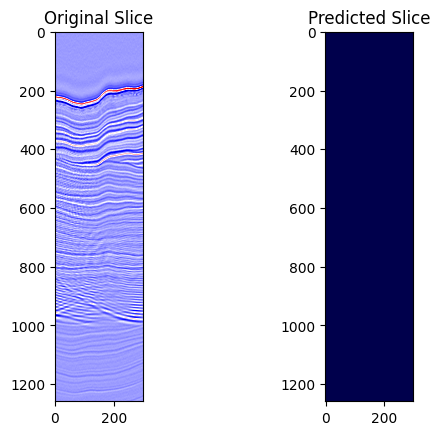

Epoch [89/200], Train Loss: 10067.3865, Train SSIM: 0.4744,           Val Loss: 10088.1912, Val SSIM: 0.4163


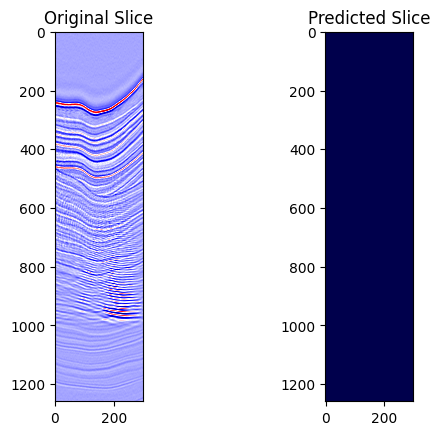

Epoch [90/200], Train Loss: 10063.0785, Train SSIM: 0.4726,           Val Loss: 10088.1913, Val SSIM: 0.4163


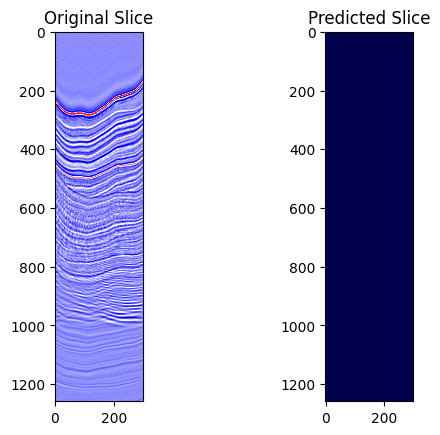

Epoch [91/200], Train Loss: 10063.8518, Train SSIM: 0.4738,           Val Loss: 10088.1914, Val SSIM: 0.4163


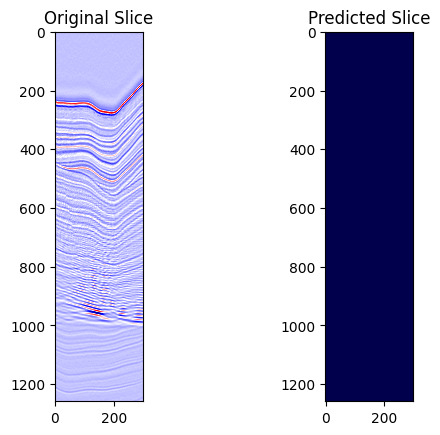

Epoch [92/200], Train Loss: 10066.9769, Train SSIM: 0.4734,           Val Loss: 10088.1913, Val SSIM: 0.4163


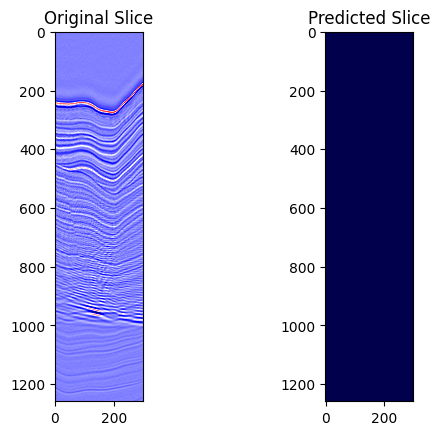

Epoch [93/200], Train Loss: 10072.0820, Train SSIM: 0.4739,           Val Loss: 10088.1915, Val SSIM: 0.4163


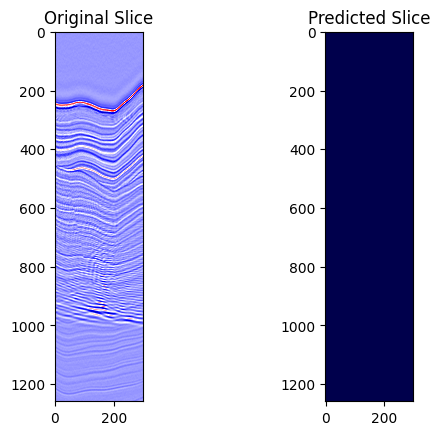

Epoch [94/200], Train Loss: 10068.3163, Train SSIM: 0.4743,           Val Loss: 10088.1911, Val SSIM: 0.4163


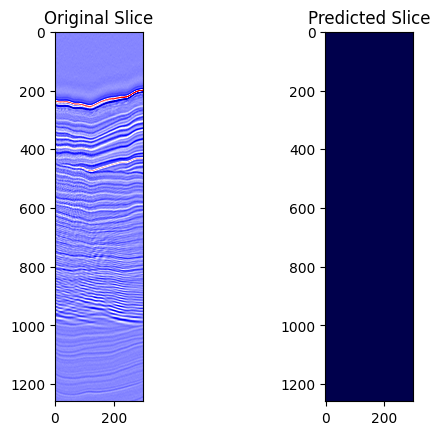

Epoch [95/200], Train Loss: 10073.3528, Train SSIM: 0.4747,           Val Loss: 10088.1914, Val SSIM: 0.4163


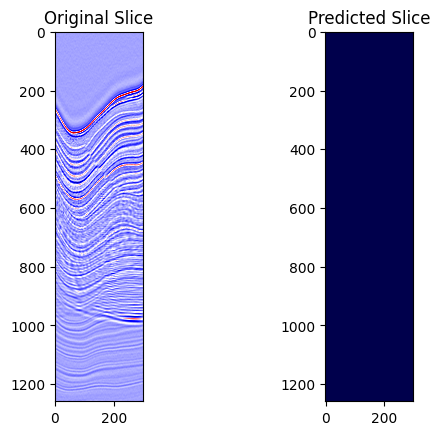

Epoch [96/200], Train Loss: 10076.4798, Train SSIM: 0.4734,           Val Loss: 10088.1911, Val SSIM: 0.4163


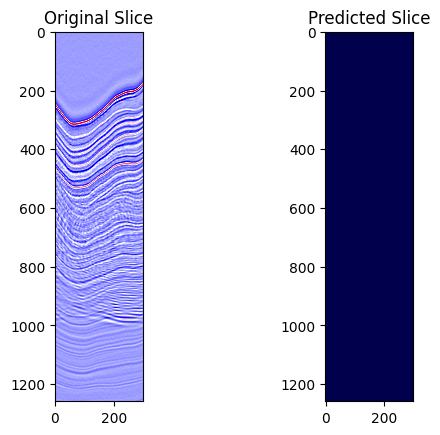

Epoch [97/200], Train Loss: 10054.7970, Train SSIM: 0.4727,           Val Loss: 10088.1913, Val SSIM: 0.4163


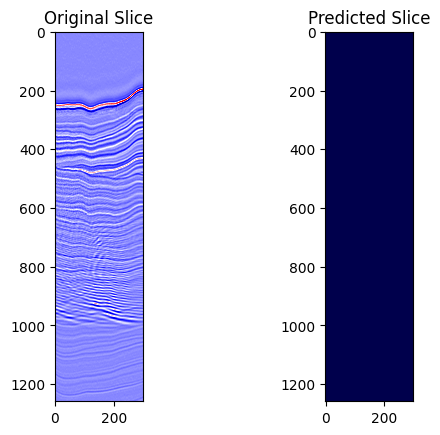

Epoch [98/200], Train Loss: 10086.4481, Train SSIM: 0.4735,           Val Loss: 10088.1915, Val SSIM: 0.4163


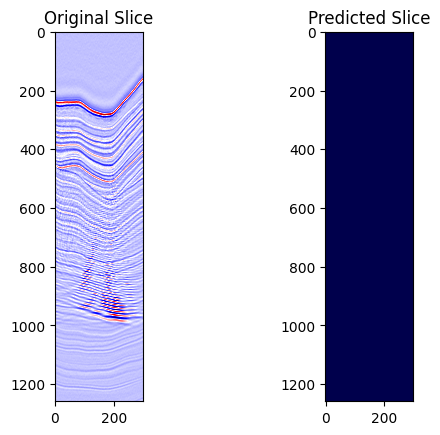

Epoch [99/200], Train Loss: 10078.8638, Train SSIM: 0.4728,           Val Loss: 10088.1918, Val SSIM: 0.4163


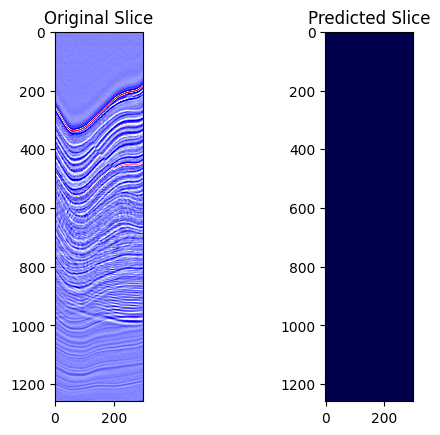

Epoch [100/200], Train Loss: 10077.9327, Train SSIM: 0.4737,           Val Loss: 10088.1912, Val SSIM: 0.4163


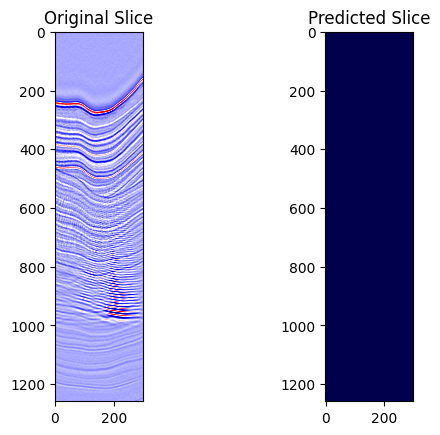

Epoch [101/200], Train Loss: 10074.2150, Train SSIM: 0.4743,           Val Loss: 10088.1912, Val SSIM: 0.4163


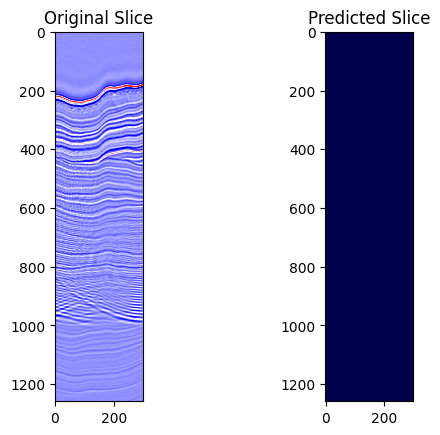

Epoch [102/200], Train Loss: 10064.0580, Train SSIM: 0.4725,           Val Loss: 10088.1913, Val SSIM: 0.4163


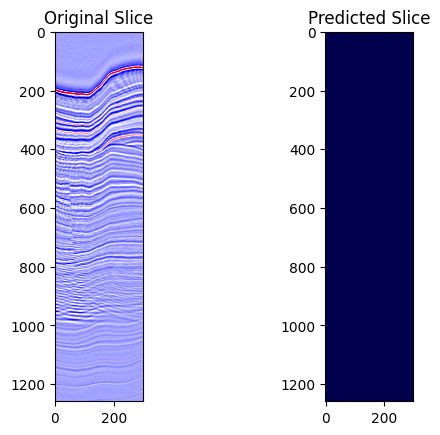

Epoch [103/200], Train Loss: 10074.9959, Train SSIM: 0.4732,           Val Loss: 10088.1913, Val SSIM: 0.4163


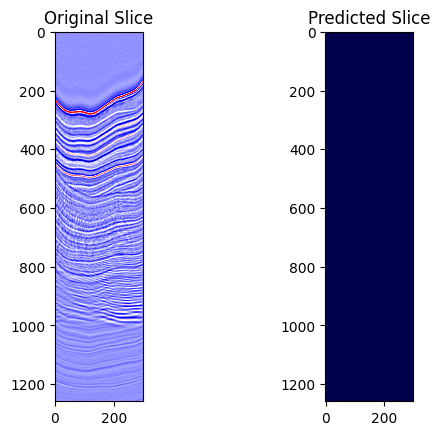

Epoch [104/200], Train Loss: 10068.8686, Train SSIM: 0.4742,           Val Loss: 10088.1914, Val SSIM: 0.4163


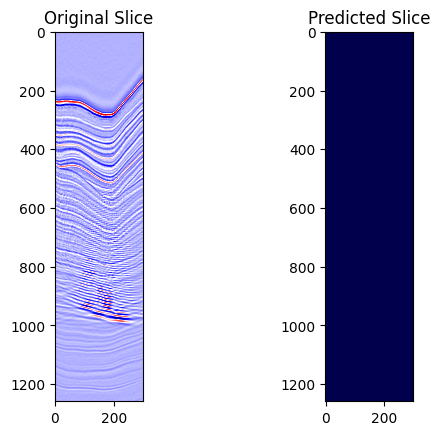

Epoch [105/200], Train Loss: 10063.3820, Train SSIM: 0.4743,           Val Loss: 10088.1911, Val SSIM: 0.4163


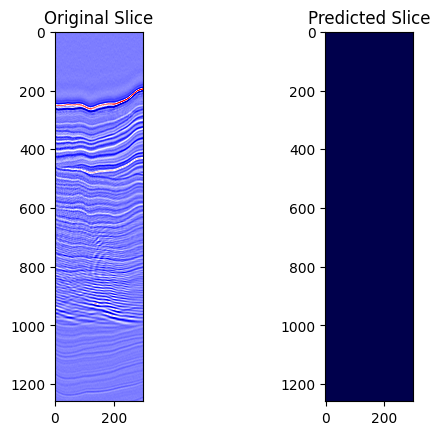

Epoch [106/200], Train Loss: 10070.2170, Train SSIM: 0.4734,           Val Loss: 10088.1910, Val SSIM: 0.4163


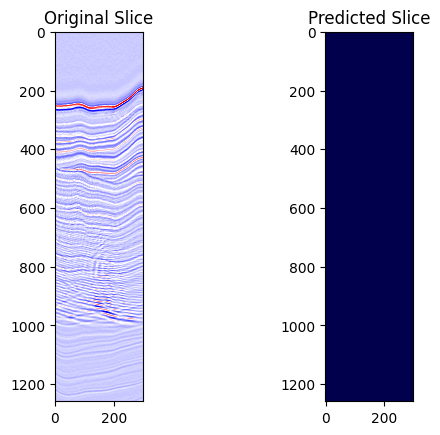

Epoch [107/200], Train Loss: 10090.2527, Train SSIM: 0.4726,           Val Loss: 10088.1911, Val SSIM: 0.4163


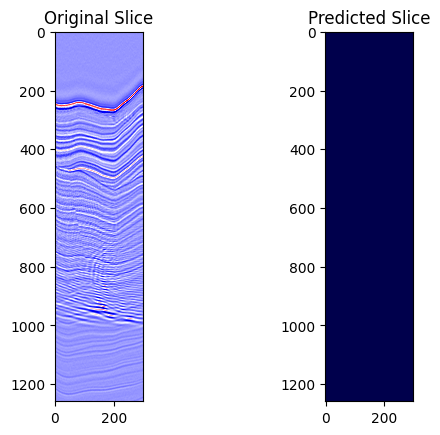

Epoch [108/200], Train Loss: 10065.4141, Train SSIM: 0.4724,           Val Loss: 10088.1915, Val SSIM: 0.4163


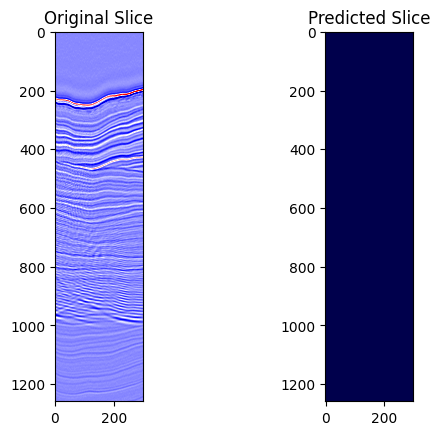

Epoch [109/200], Train Loss: 10066.0969, Train SSIM: 0.4735,           Val Loss: 10088.1916, Val SSIM: 0.4163


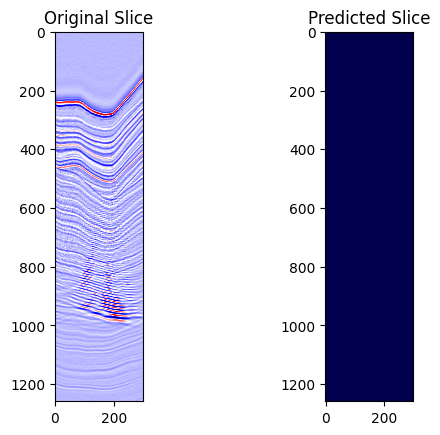

Epoch [110/200], Train Loss: 10062.6901, Train SSIM: 0.4729,           Val Loss: 10088.1915, Val SSIM: 0.4163


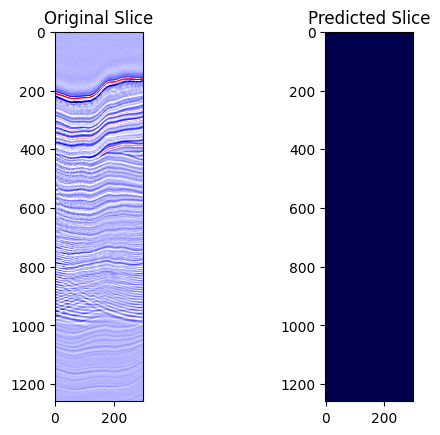

Epoch [111/200], Train Loss: 10070.5856, Train SSIM: 0.4730,           Val Loss: 10088.1917, Val SSIM: 0.4163


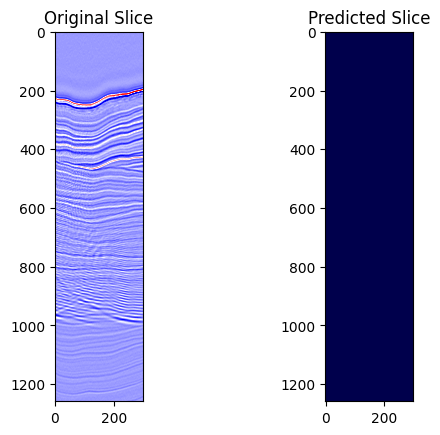

Epoch [112/200], Train Loss: 10072.3988, Train SSIM: 0.4733,           Val Loss: 10088.1914, Val SSIM: 0.4163


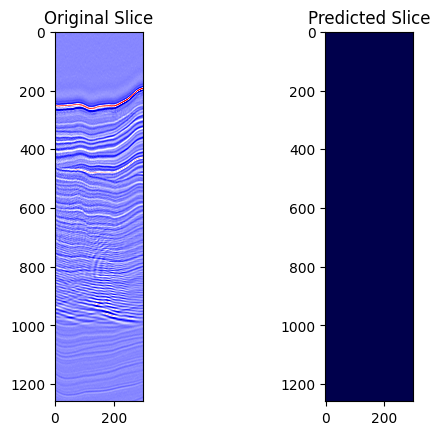

Epoch [113/200], Train Loss: 10060.4144, Train SSIM: 0.4735,           Val Loss: 10088.1911, Val SSIM: 0.4163


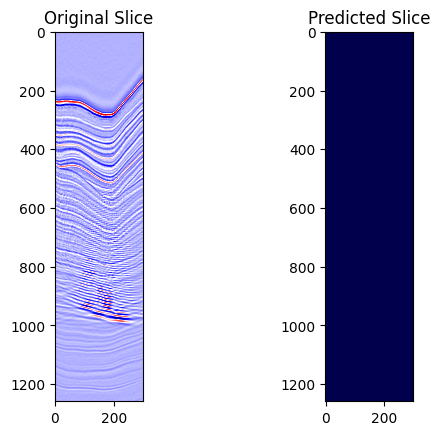

Epoch [114/200], Train Loss: 10079.8377, Train SSIM: 0.4732,           Val Loss: 10088.1913, Val SSIM: 0.4163


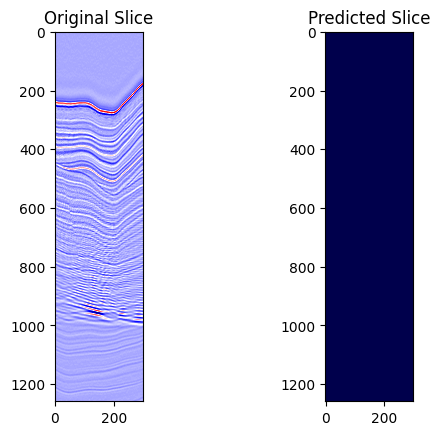

Epoch [115/200], Train Loss: 10072.7417, Train SSIM: 0.4737,           Val Loss: 10088.1912, Val SSIM: 0.4163


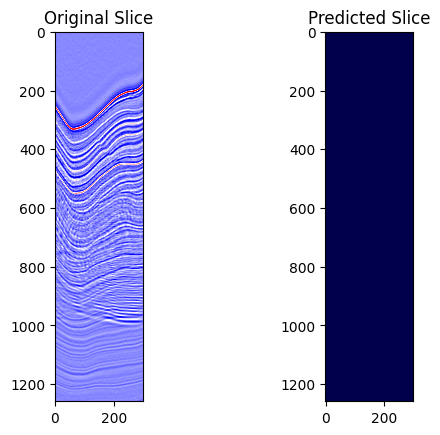

Epoch [116/200], Train Loss: 10071.6962, Train SSIM: 0.4746,           Val Loss: 10088.1915, Val SSIM: 0.4163


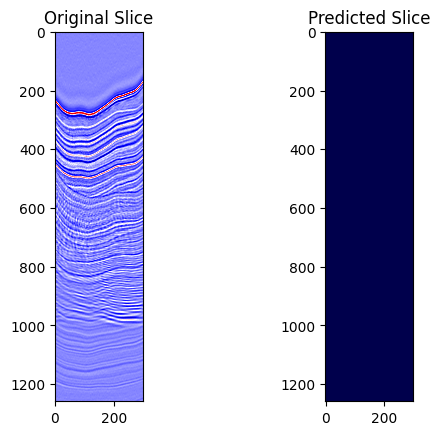

Epoch [117/200], Train Loss: 10066.7038, Train SSIM: 0.4742,           Val Loss: 10088.1914, Val SSIM: 0.4163


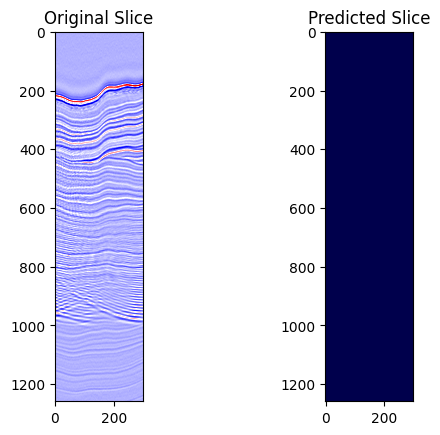

Epoch [118/200], Train Loss: 10067.2101, Train SSIM: 0.4747,           Val Loss: 10088.1913, Val SSIM: 0.4163


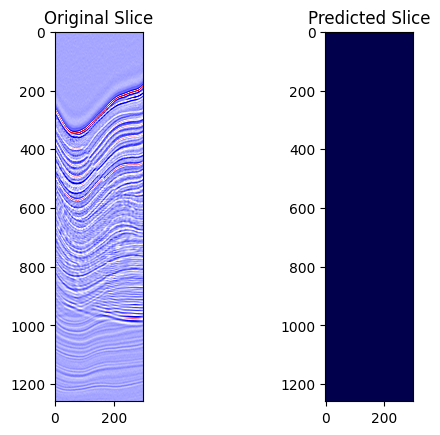

Epoch [119/200], Train Loss: 10063.2335, Train SSIM: 0.4738,           Val Loss: 10088.1914, Val SSIM: 0.4163


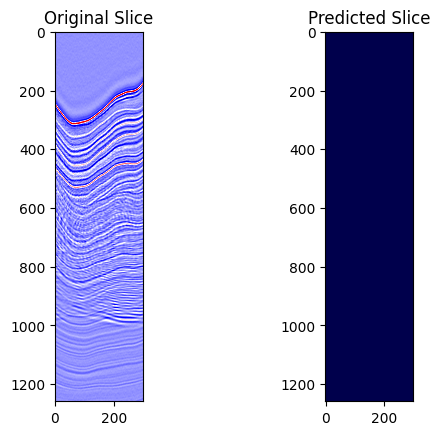

Epoch [120/200], Train Loss: 10063.9616, Train SSIM: 0.4739,           Val Loss: 10088.1913, Val SSIM: 0.4163


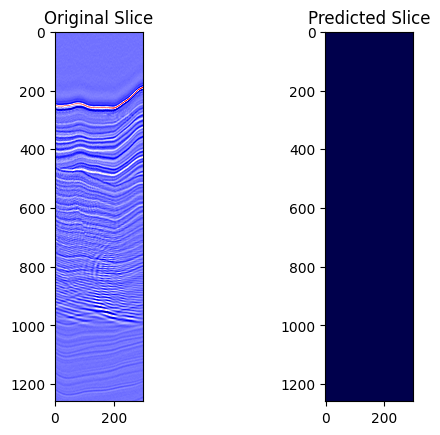

Epoch [121/200], Train Loss: 10064.7562, Train SSIM: 0.4725,           Val Loss: 10088.1915, Val SSIM: 0.4163


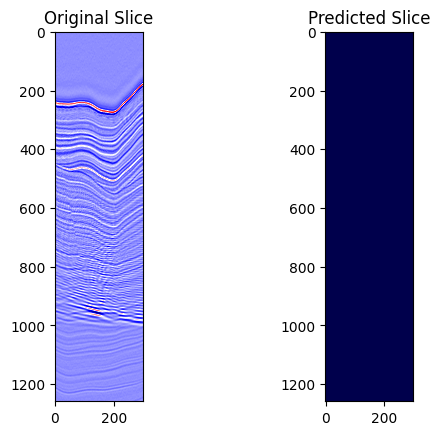

Epoch [122/200], Train Loss: 10079.6432, Train SSIM: 0.4740,           Val Loss: 10088.1917, Val SSIM: 0.4163


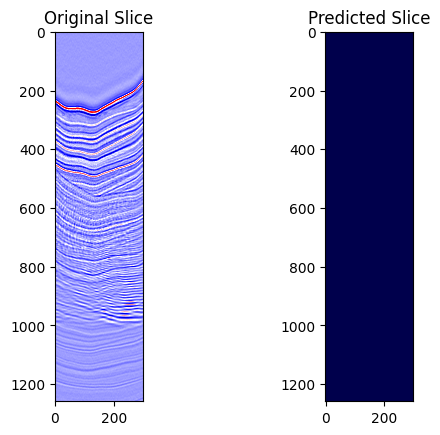

Epoch [123/200], Train Loss: 10067.5788, Train SSIM: 0.4735,           Val Loss: 10088.1914, Val SSIM: 0.4163


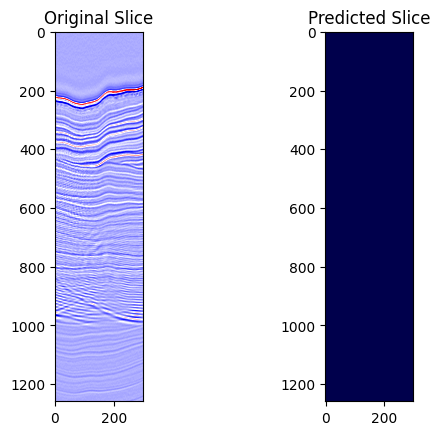

Epoch [124/200], Train Loss: 10074.7652, Train SSIM: 0.4746,           Val Loss: 10088.1914, Val SSIM: 0.4163


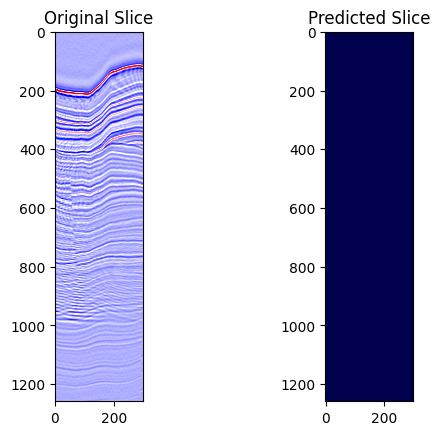

Epoch [125/200], Train Loss: 10083.0763, Train SSIM: 0.4724,           Val Loss: 10088.1913, Val SSIM: 0.4163


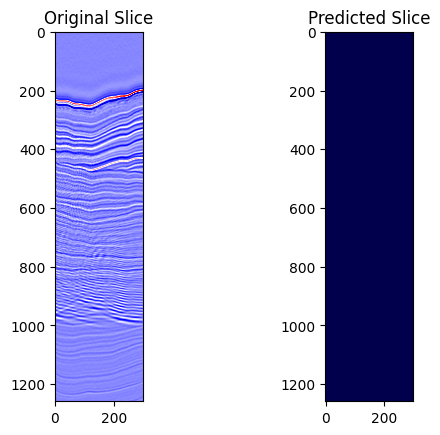

Epoch [126/200], Train Loss: 10074.3501, Train SSIM: 0.4731,           Val Loss: 10088.1914, Val SSIM: 0.4163


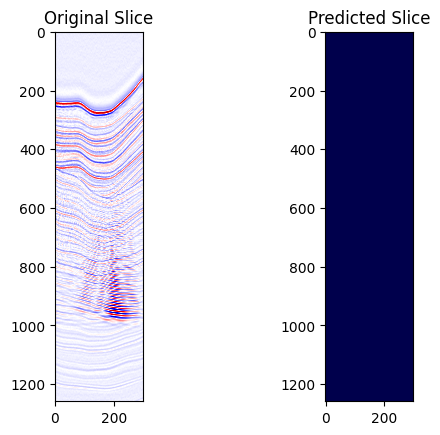

Epoch [127/200], Train Loss: 10066.8921, Train SSIM: 0.4735,           Val Loss: 10088.1909, Val SSIM: 0.4163


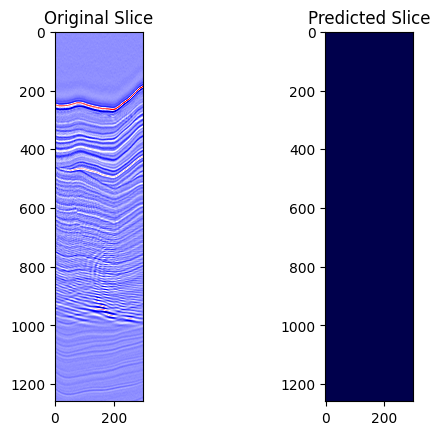

Epoch [128/200], Train Loss: 10063.8328, Train SSIM: 0.4729,           Val Loss: 10088.1912, Val SSIM: 0.4163


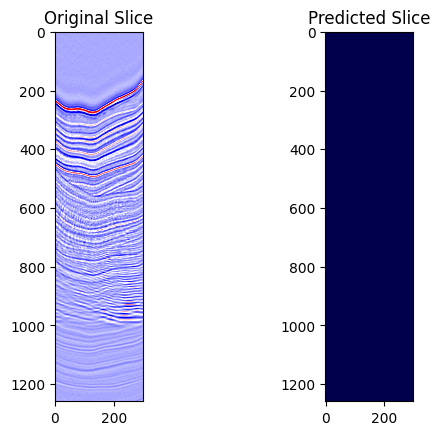

Epoch [129/200], Train Loss: 10068.1640, Train SSIM: 0.4736,           Val Loss: 10088.1915, Val SSIM: 0.4163


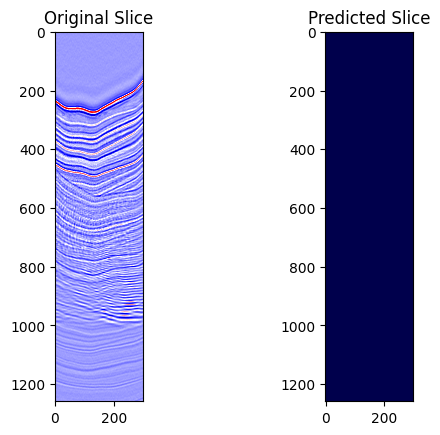

Epoch [130/200], Train Loss: 10074.7610, Train SSIM: 0.4736,           Val Loss: 10088.1911, Val SSIM: 0.4163


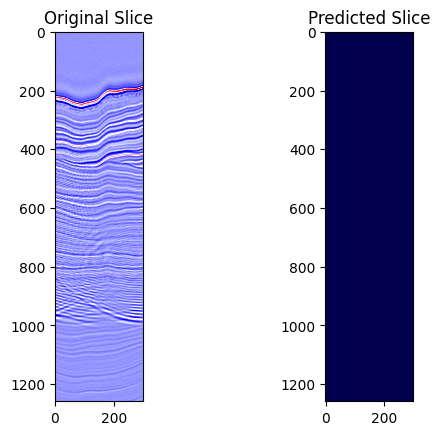

Epoch [131/200], Train Loss: 10079.2586, Train SSIM: 0.4740,           Val Loss: 10088.1914, Val SSIM: 0.4163


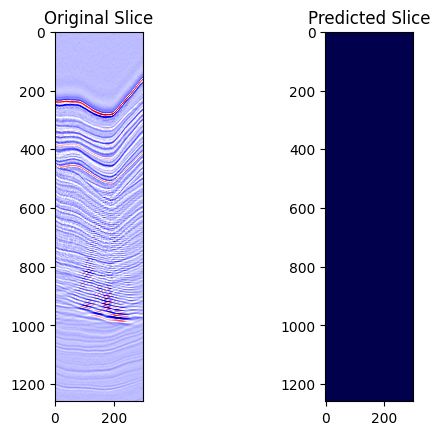

Epoch [132/200], Train Loss: 10069.6629, Train SSIM: 0.4733,           Val Loss: 10088.1915, Val SSIM: 0.4163


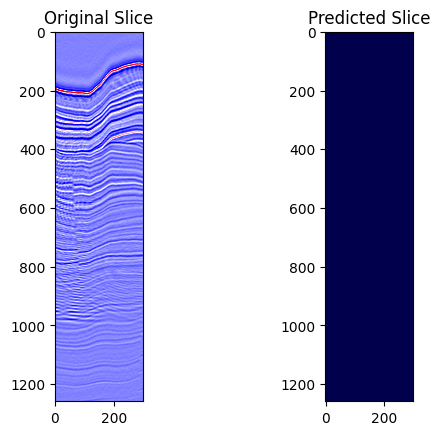

Epoch [133/200], Train Loss: 10062.3984, Train SSIM: 0.4729,           Val Loss: 10088.1913, Val SSIM: 0.4163


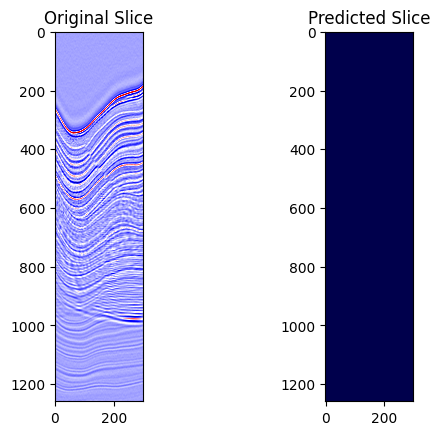

Epoch [134/200], Train Loss: 10065.1291, Train SSIM: 0.4733,           Val Loss: 10088.1913, Val SSIM: 0.4163


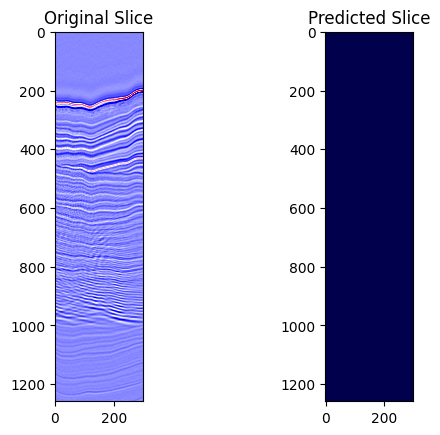

Epoch [135/200], Train Loss: 10071.6117, Train SSIM: 0.4731,           Val Loss: 10088.1912, Val SSIM: 0.4163


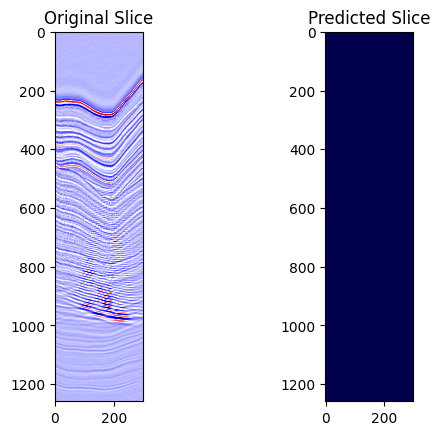

Epoch [136/200], Train Loss: 10075.4040, Train SSIM: 0.4732,           Val Loss: 10088.1913, Val SSIM: 0.4163


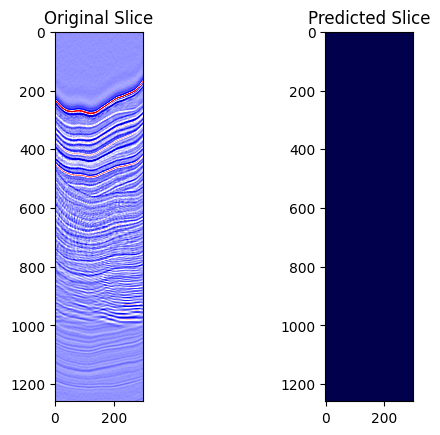

Epoch [137/200], Train Loss: 10067.8663, Train SSIM: 0.4738,           Val Loss: 10088.1913, Val SSIM: 0.4163


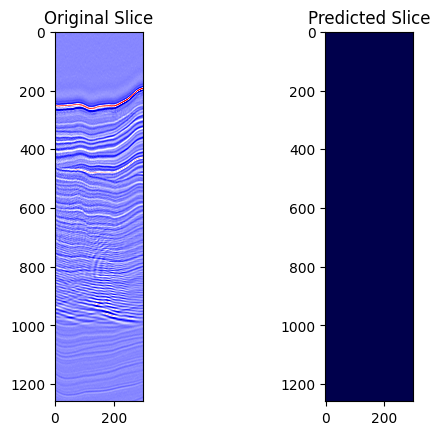

Epoch [138/200], Train Loss: 10078.8154, Train SSIM: 0.4753,           Val Loss: 10088.1913, Val SSIM: 0.4163


In [ ]:
# Number of epochs
num_epochs = 200

# Training loop
for epoch in range(num_epochs):
    model.train()
    running_loss = 0.0
    running_ssim = 0.0

    for x_batch, y_batch in train_loader:
        optimizer.zero_grad()
        outputs = model(x_batch)
        loss = criterion(outputs, y_batch)
        loss.backward()
        optimizer.step()
        running_loss += loss.item()
        batch_ssim = ssim_metric(outputs.detach(), y_batch.detach())
        running_ssim += batch_ssim.item()

    # Validation phase
    model.eval()
    val_loss = 0.0
    val_ssim = 0.0
    with torch.no_grad():
        for x_val, y_val in val_loader:
            val_outputs = model(x_val)
            val_loss += criterion(val_outputs, y_val).item()
            val_ssim += ssim_metric(val_outputs, y_val).item()

    # Prediction on a single slice from X_slices_t
    random_slice = X_slices_t[torch.randint(0, len(X_slices_t), (1,)).item()]

    # Convert to PyTorch tensor and add batch and channel dimensions
    random_slice = torch.tensor(random_slice, dtype=torch.float32).unsqueeze(0).unsqueeze(0)

    prediction = model(random_slice).detach()

    # Visualize the original and predicted slice
    plt.subplot(1, 2, 1)
    plt.title("Original Slice")
    plt.imshow(random_slice.squeeze().cpu().numpy(), cmap='seismic')

    plt.subplot(1, 2, 2)
    plt.title("Predicted Slice")
    plt.imshow(prediction.squeeze().cpu().numpy(), cmap='seismic')
    plt.show()

    print(f"Epoch [{epoch + 1}/{num_epochs}], Train Loss: {running_loss / len(train_loader):.4f}, Train SSIM: {running_ssim / len(train_loader):.4f}, \
          Val Loss: {val_loss / len(val_loader):.4f}, Val SSIM: {val_ssim / len(val_loader):.4f}")


print("Training complete!")
